# Code de Baptiste pour le classement au jugement majoritaire

In [4]:
import random as rd
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import plotly.graph_objects as px

In [5]:
df_ToutParis_complet = pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1', sep = ',')
df_ToutParis_complet_NUM = df_ToutParis_complet[df_ToutParis_complet['Urne'] == 'numerique']
df_ToutParis_complet_PAPER = df_ToutParis_complet[df_ToutParis_complet['Urne'] != 'num']
#df_ToutParis_complet
df_ToutParis_complet_SansNuls = pd.read_csv('Votes ToutParis complet sans nuls.csv', encoding = 'latin1', sep = ',')
df_ToutParis_complet_SansNuls_PAPIER = df_ToutParis_complet_SansNuls[df_ToutParis_complet_SansNuls['Urne'] != 'num']
df_ToutParis_complet_SansNuls_NUM = df_ToutParis_complet_SansNuls[df_ToutParis_complet_SansNuls['Urne'] == 'num']

/tmp/ipykernel_592/2991733341.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ToutParis_complet = pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1', sep = ',')
/tmp/ipykernel_592/2991733341.py:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ToutParis_complet_SansNuls = pd.read_csv('Votes ToutParis complet sans nuls.csv', encoding = 'latin1', sep = ',')


In [6]:
list_projet = list(df_ToutParis_complet.columns)
del list_projet[0]
del list_projet[0]
del list_projet[0]
del list_projet[0]

del list_projet[-1]
del list_projet[-1]
del list_projet[-1]
del list_projet[-1]
del list_projet[-1]
del list_projet[-1]
#list_projet

In [7]:
def Madjority_Judgement(df):
    list_projet = list(df.columns)
    del list_projet[0]
    del list_projet[0]
    del list_projet[0]
    del list_projet[0]
    del list_projet[-1]
    del list_projet[-1]
    del list_projet[-1]
    del list_projet[-1]
    del list_projet[-1]
    del list_projet[-1]
    VotesValidesAllProjets = list()
    MentionsMajoritaires = list()
    PartMinf = list()
    PartMsup = list()
    for i in range(0,len(list_projet)):
        VotesValidesProjet = [1 for m in range(0,list(df[list_projet[i]]).count('1'))] + [2 for n in range(0,list(df[list_projet[i]]).count('2'))] + [3 for l in range(0,list(df[list_projet[i]]).count('3'))] + [4 for o in range(0,list(df[list_projet[i]]).count('4'))]
        VotesValidesAllProjets.append(VotesValidesProjet)
    
    for j in range(0,len(VotesValidesAllProjets)):
        Mentions_projets = sorted(VotesValidesAllProjets[j], reverse=True)
        if (len(Mentions_projets)/2) == int(len(Mentions_projets)/2):
            MM = Mentions_projets[int(len(Mentions_projets)/2)]
        else:
            MM = Mentions_projets[int((len(Mentions_projets)/2)+0.5)]
        MentionsMajoritaires.append(MM)
    
    Minf = [h+1 for h in MentionsMajoritaires]
    
    for t in range(0,len(Minf)):
        PartMinf.append(((VotesValidesAllProjets[t].count(Minf[t]))/(len(VotesValidesAllProjets[t])))*100 + ((VotesValidesAllProjets[t].count(Minf[t]+1))/(len(VotesValidesAllProjets[t])))*100 + ((VotesValidesAllProjets[t].count(Minf[t]+2))/(len(VotesValidesAllProjets[t])))*100)
    
    Msup = [h-1 for h in MentionsMajoritaires]
    
    for t in range(0,len(Msup)):
        PartMsup.append(((VotesValidesAllProjets[t].count(Msup[t]))/(len(VotesValidesAllProjets[t])))*100 + ((VotesValidesAllProjets[t].count(Msup[t]-1))/(len(VotesValidesAllProjets[t])))*100 + ((VotesValidesAllProjets[t].count(Msup[t]-2))/(len(VotesValidesAllProjets[t])))*100)
    
    
    df_MentionsMajoritaires = pd.DataFrame({'Projet':list_projet,
                                            'Part Mention sup':PartMsup,
                                           'Mention Majoritaire':MentionsMajoritaires,
                                           'Part Mentin inf':PartMinf})
       
    df_MentionsMajoritaires=df_MentionsMajoritaires.sort_values('Mention Majoritaire')
    return(df_MentionsMajoritaires)

Madjority_Judgement(df_ToutParis_complet_SansNuls)


def Comparaison(df_MJ):
    dict_losers = {}
    for row in df_MJ.iterrows():
        dict_losers[row[1][0]] = []
        for rowcompar in df_MJ.iterrows():   
            if row[1][0] != rowcompar[1][0]:
    
                if int(row[1][2]) < int(rowcompar[1][2]):
                    dict_losers[row[1][0]].append(rowcompar[1][0])
                elif int(row[1][2]) == int(rowcompar[1][2]):
                    
                    maxi = max([row[1][1],row[1][3],rowcompar[1][1],rowcompar[1][3]])
                    
                    if maxi == row[1][1]:
                        dict_losers[row[1][0]].append(rowcompar[1][0])
                    elif maxi == row[1][3]:
                        None
                    elif maxi == rowcompar[1][1]:
                        None
                    elif maxi == rowcompar[1][3]:
                        dict_losers[row[1][0]].append(rowcompar[1][0])
    return(dict_losers)

def ClassementMJ(df):
    ls = Comparaison(Madjority_Judgement(df))
    classement = []
    for i in range(0,len(ls)):
        classement.append(len(ls) - len(ls[list(ls.keys())[i]]))
        
    CL = pd.DataFrame({'Rang':classement},index = list(ls.keys()))
    CL=CL.sort_values('Rang')
    return(CL)

In [6]:
ClassementMJ(pd.read_csv('Votes 75013 complet.csv', encoding = 'latin1', sep = ','))

,Rang
3 - Maison des Associations et club-house : se retrouver et recevoir !,1
7 - Vegetaliser et rafraichir les cours des ecoles et colleges,2
1 - La modernisation du centre sportif Georges Carpentier,3
6 - Modernisation et renovation de vos Centres Paris Anim,4
2 - Une activite sportive pour toutes et tous !,5
8 - Vos projets pour ameliorer le cadre de vie dans nos Ã©coles !,6
"10 - Vos micro-quartiers : fresques, jeux, jardins et accessibilite !",7
5 - Ameliorer l acces aux outils numeriques dans les ecoles !,8
4 - Vos projets pour faire du partage une valeur commune !,9
9 - De la place pour les animaux au Parc de Choisy : plus de biodiversite,10


# Condorcet

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

## Matrices de Condorcet avec le +/- ; Confrontations Indirectes

In [ ]:
# Fonction finale pour obtenir la matrice des préférences avec les confrontations indirectes (votes uniques 1 ou 4)

def CondorcetMethod4(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] < arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                        elif arr.iloc[User, colonne_i] > arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                        else:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 0.5
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 0.5
                            
        # On ajoute les confrontations indirectes :
            # -> un vote pour le projet i contre tous les autres ou un vote unique pour tous les autres que le projet i
        if arr.iloc[User, 4:-6].eq('novote').sum() == (Taille-1):
            for index_i in range(Taille):
                if arr.iloc[User, index_i] == 1:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_j, index_i] += 1
                elif arr.iloc[User, index_i] == 4:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_i, index_j] += 1
                        
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2
    
    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref0 = pd.DataFrame(miroir_pref)
    df_condorcet_pref = df_condorcet_pref0.copy()
    # On affiche sur le triangle supérieur le nombre de préférences en plus ou en moins que celles affichées sur le triangle inférieur
    for i in range(Taille):
        for j in range(Taille-1 - i):
            df_condorcet_pref.iloc[i, j] = df_condorcet_pref0.iloc[i, j] - df_condorcet_pref0.iloc[Taille-1-j, Taille-1-i]
            df_condorcet_pref.iloc[i, j] = f"{df_condorcet_pref.iloc[i, j]:+}"
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_condorcet)):
        text = ax.text(len(df_condorcet.columns)-(1 if arrondissement != '75005' else 1.6), i+0.5,df_condorcet.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if df_condorcet.iloc[i, j] == 0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

### Matrices +/- ; Confrontations Indirectes ; Papier + Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs0 = {}
dico0 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod4(current_df,projets)
    dico_rangs0[arrondissement] = resultats[6]
    dico0[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

In [25]:
liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']

for arrondissement in liste_arr:
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    print(arrondissement, ' : ', len(projets))

Paris Centre  :  16


/tmp/ipykernel_592/1247922606.py:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')


Tout Paris  :  13
75005  :  6
75006  :  10
75007  :  10
75008  :  11
75009  :  7
75010  :  12
75011  :  10
75012  :  12
75013  :  10
75014  :  10
75015  :  11
75016  :  10
75017  :  20
75018  :  13
75019  :  12
75020  :  11


#### Code en plus pour les matrices que A=B et que A>B pour Rida

In [19]:
# Fonction finale pour obtenir la matrice des préférences avec les confrontations indirectes (votes uniques 1 ou 4)

def CondorcetMethod_A_equals_B(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] == arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                        
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2
    
    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref0 = pd.DataFrame(miroir_pref)
    df_condorcet_pref = df_condorcet_pref0.copy()
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Pour ces matrices uniquement, 1 point est attribué si projet A a reçu le même vote que projet B (et non 0.5)',\
                fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Pour ces matrices uniquement, 1 point est attribué si projet A a reçu le même vote que projet B (et non 0.5)',\
                fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if i == (Taille+1-j):
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='grey')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

On cherche le gagant de Condorcet ou de Lull pour le : Paris Centre
                                                    Rang  Rang de Condorcet
Ameliorer le confort et l amenagement d etablis...     1                  1
Remplacer et renover les bancs de Paris Centre         2                  1
Rendre l eglise St-Germain l Auxerrois accessib...     3                  1
Poursuivre la refection des chaussees des Grand...     4                  1
Restaurer les fontaines du Theatre Francais            5                  1
Completer la renovation des arcades de la rue d...     6                  1
Vegetaliser temporairement la rue Greneta              7                  1
Restaurer le patrimoine de 3 eglises de Paris C...     8                  1
RÃ©nover le petit tunnel de l ecluse du bassin ...     9                  1
Installer du mobilier urbain sur les berges pou...    10                  1
Restaurer les peintures de 2 eglises et tracer ...    11                  1
Renover les reverber

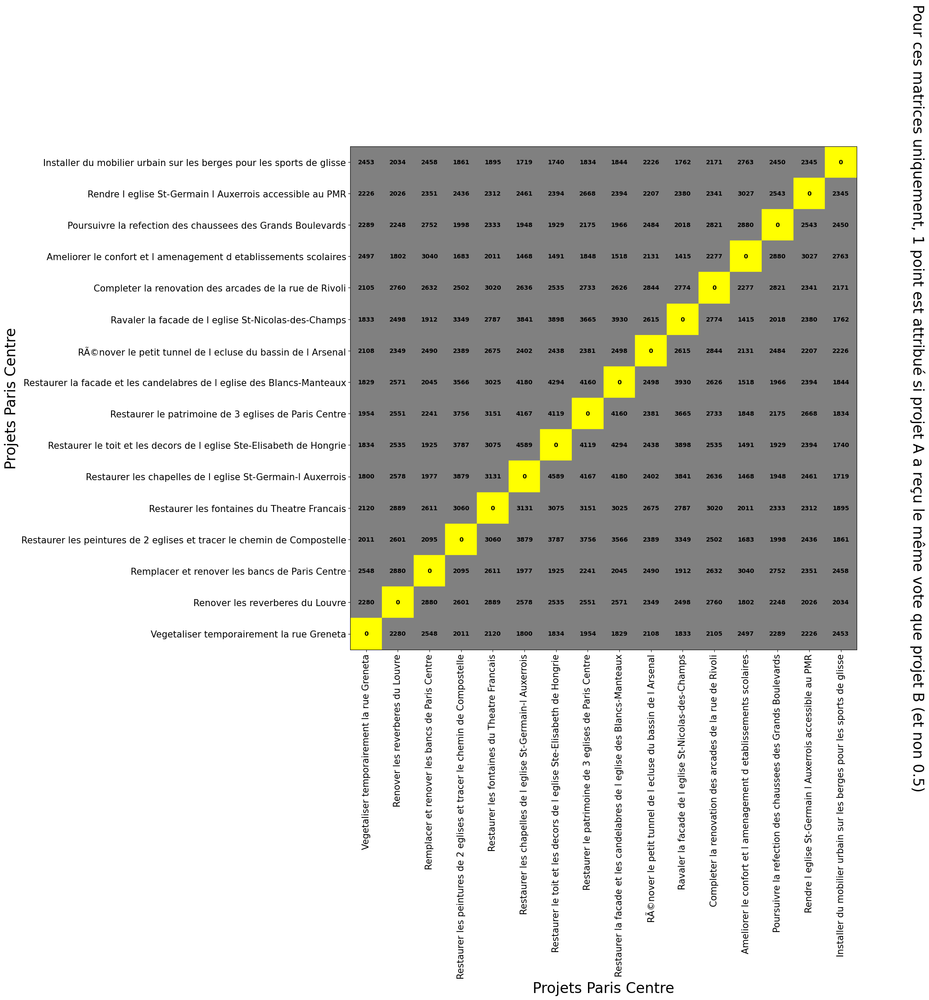

On cherche le gagant de Condorcet ou de Lull pour le : Tout Paris


/tmp/ipykernel_592/1524228631.py:9: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')


                                                    Rang  Rang de Condorcet
Une ville plus belle et plus propre                    1                  1
Des ilots de fraicheurs pour faire face aux can...     2                  1
Des lieux anti-gaspi et solidaires en bas de ch...     3                  1
Plus de biodiversite dans la ville                     4                  1
Des batiments publics plus performants face au ...     5                  1
Des pistes cyclables plus colorees et securisees       6                  1
Du sport pour tous les gouts dans la ville             7                  1
De nouvelles manieres d apprendre pour les enfa...     8                  1
La solidarite en actions dans la ville                 9                  1
De nouveaux outils pour mieux mesurer le bruit ...    10                  1
Le numerique pour toutes et tous                      11                  1
La Pagode du centre sportif Jules Ladoumegue re...    12                  1
De nouveaux 

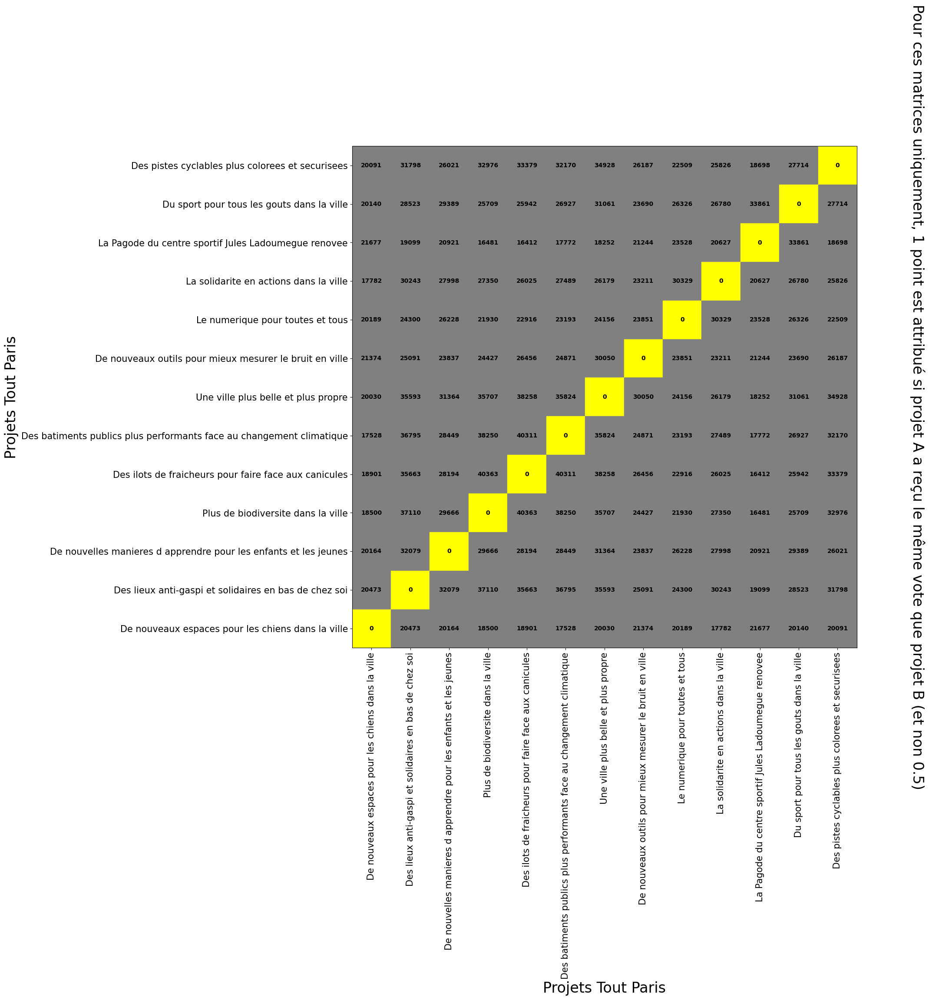

On cherche le gagant de Condorcet ou de Lull pour le : 75005
                                                    Rang  Rang de Condorcet
Embellir et renover les ecoles du 5e                   1                  1
Fontaines et piscine, plus de fraicheur dans le 5e     2                  1
Humanisation de La Peniche du Coeur                    3                  1
Restaurons les oeuvres d art de nos eglises            4                  1
Apportons une touche de modernite aux lieux de ...     5                  1
Rendre sa splendeur a l eglise Saint-Severin           6                  1


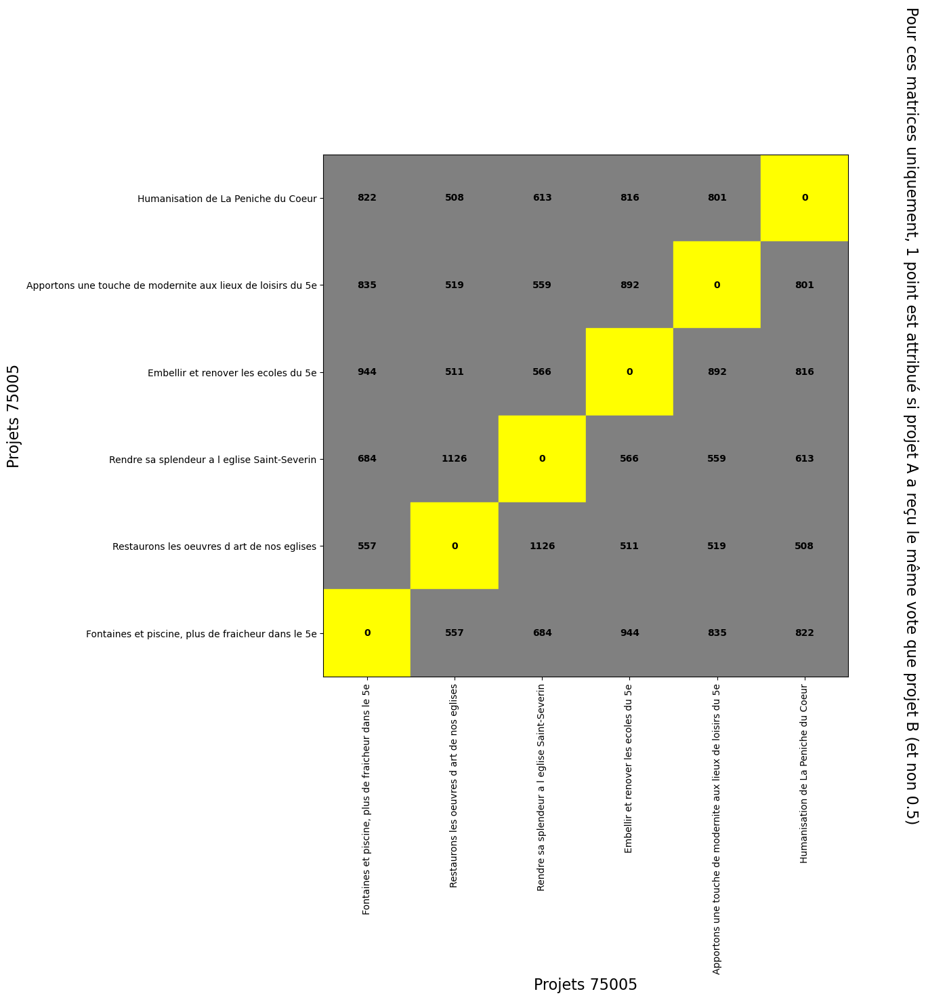

On cherche le gagant de Condorcet ou de Lull pour le : 75006
                                                    Rang  Rang de Condorcet
Restaurer le patrimoine cultuel et culturel du ...     1                  1
Des videoprojecteurs interactifs pour les ecole...     2                  1
Revelation d un petit jardin - Angle Littre-Vau...     3                  1
Ouverture d un Jardin Partage - Rue du Cherche-...     4                  1
Creer un espace scenique ouvert a tous publics ...     5                  1
Dotation aux ecoles de solution de fraicheur           6                  1
Les jardiniers du Jardinet                             7                  1
Bagagerie solidaire dans le 6e arrondissement          8                  1
Installation de brumisateurs urbains                   9                  1
Un parc d exercice et de detente canin                10                  1


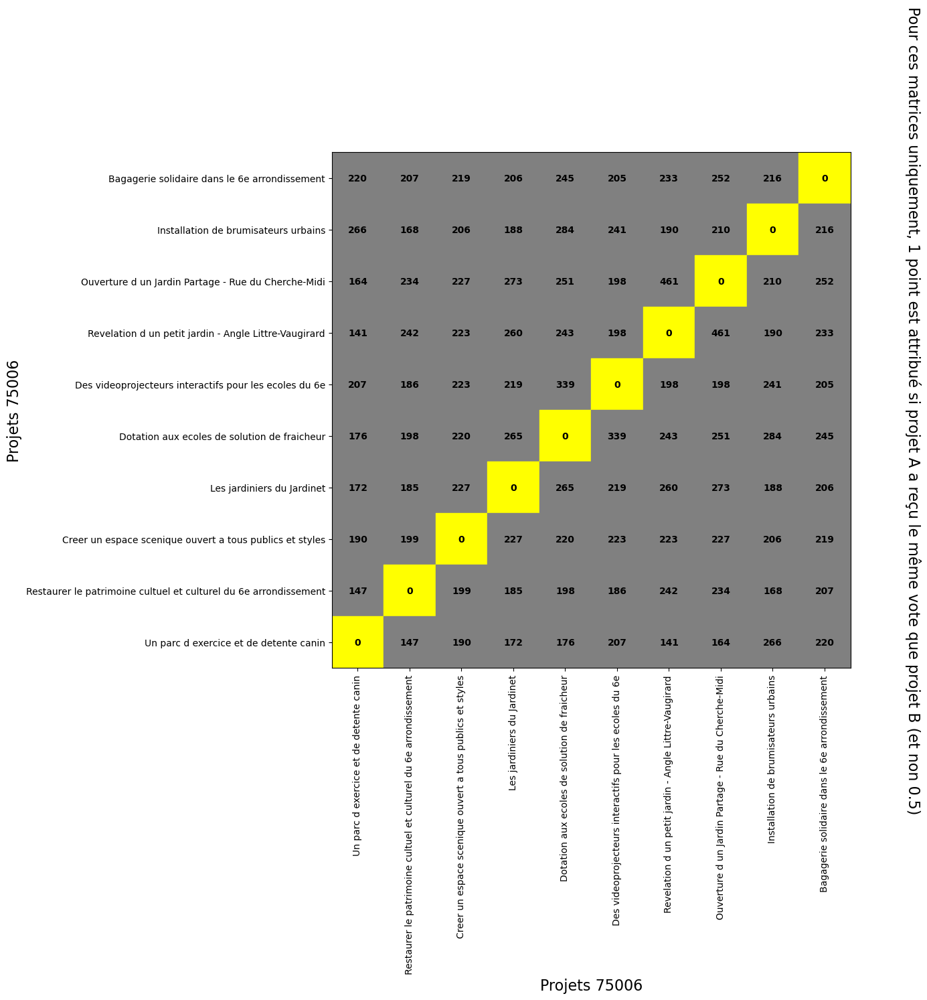

On cherche le gagant de Condorcet ou de Lull pour le : 75007
                                                    Rang  Rang de Condorcet
 Reamenagement des espaces dedies a la jeunesse        1                  1
Restaurer le Champ de Mars et son mobilier hist...     2                  1
Reamenager et equiper les espaces verts du 7e a...     3                  1
Embellir les cours des ecoles du 7e arrondissem...     4                  1
Vegetalisation et equipement de la place Fontenoy      5                  1
Sauvegarde des statues de l arrondissement             6                  1
Restauration des chapelles Sainte-Valere et Sai...     7                  1
ilot refuge pour pietons et velos pont Alexandr...     8                  1
Restaurer la sacristie de l eglise Saint-Thomas...     9                  1
Restauration du temple de Pentemont                   10                  1


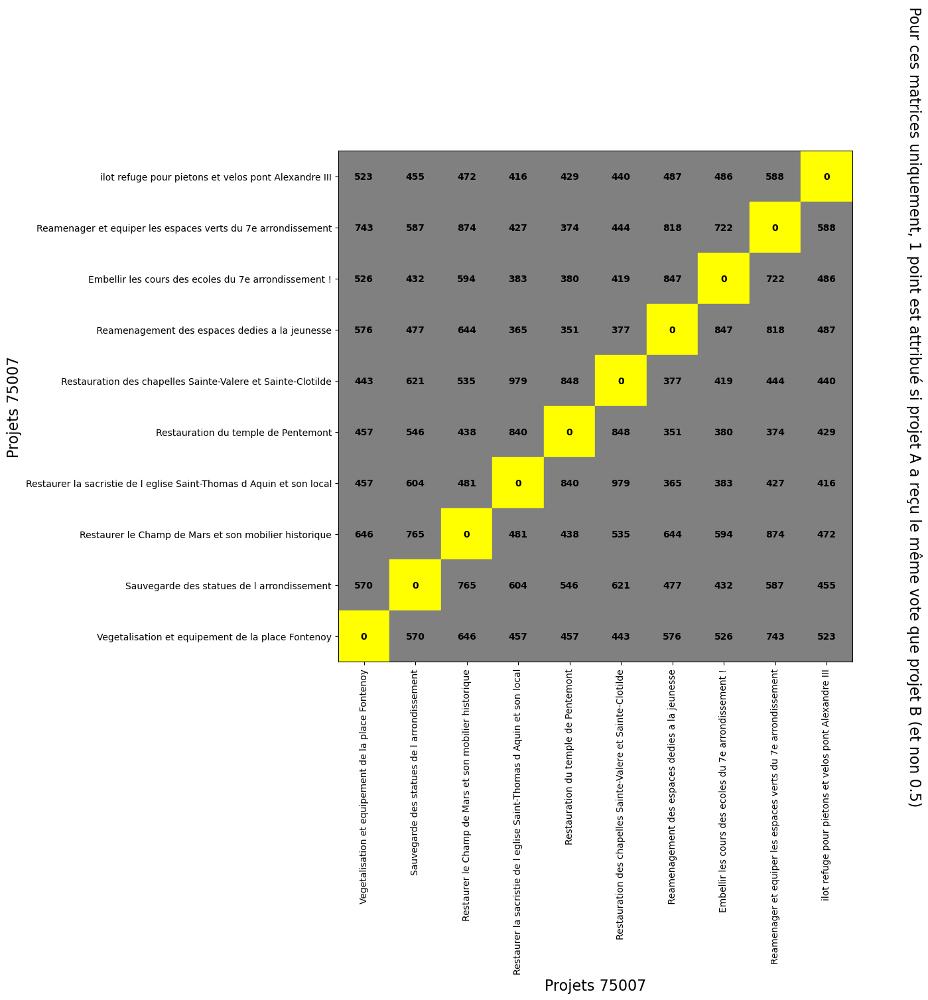

On cherche le gagant de Condorcet ou de Lull pour le : 75008
                                                    Rang  Rang de Condorcet
Apaiser, vegetaliser des rues et places de l ar...     1                  1
Proteger les pietons et reduire les nuisances s...     2                  1
Poursuivre le renouveau du parc Monceau                3                  1
Developper le commerce de proximite dans le qua...     4                  1
Renover le marche aux fleurs de la Madeleine et...     5                  1
Restaurer la facade ouest de l eglise de la Mad...     6                  1
Restaurer le patrimoine de la place de la Concorde     7                  1
Restaurer les grilles emblematiques du parc Mon...     8                  1
Restaurer les grilles emblematiques du parc Mon...     9                  1
Restaurer les grilles emblematiques du parc Mon...    10                  1
Renover les grilles de l avenue Ruysdael et les...    11                  1


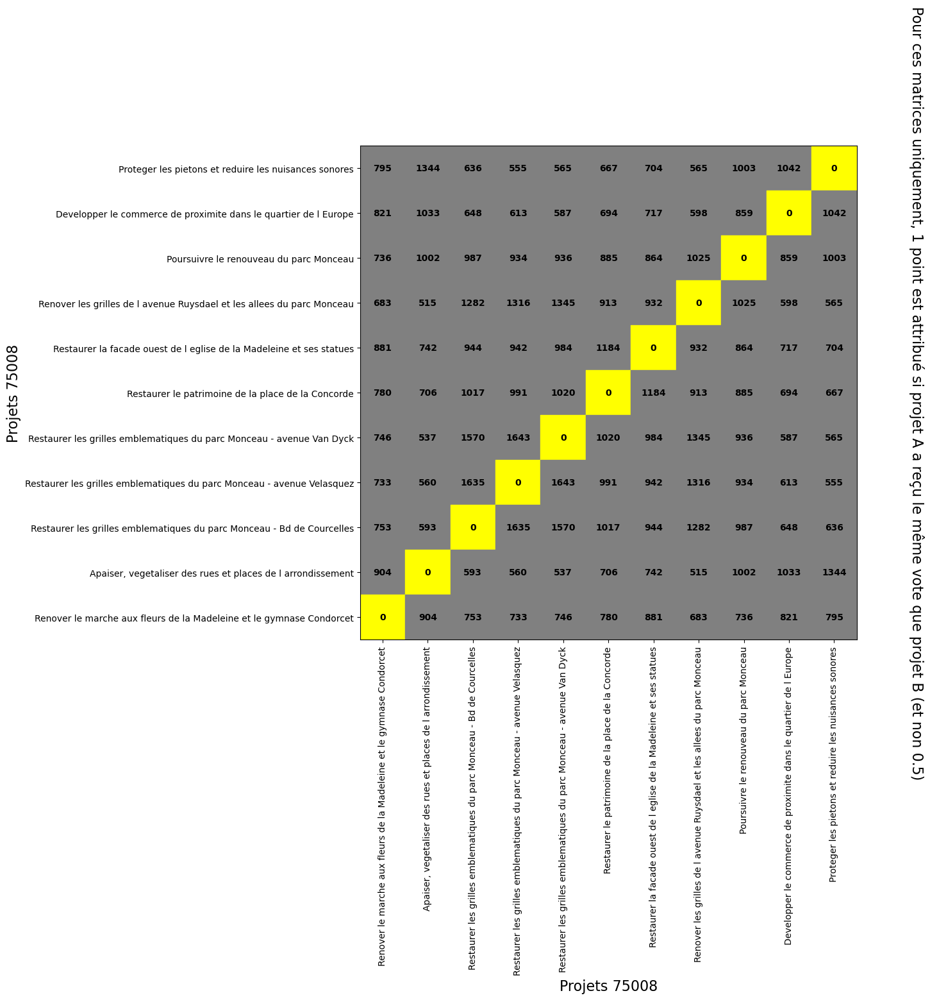

On cherche le gagant de Condorcet ou de Lull pour le : 75009
                                                    Rang  Rang de Condorcet
Reinventer la maison pour tous YMCA de la rue d...     1                  1
Diversifier les commerces dans le quartier Pigalle     2                  1
Restaurer les publicites peintes de la rue des ...     3                  1
Ameliorer le confort des usagers du Conservatoi...     4                  1
Installer des radars pedagogiques                      5                  1
Moderniser les salles d escrime du gymnase Buff...     6                  1
Creer un parcours patrimonial grace a des QR codes     7                  1


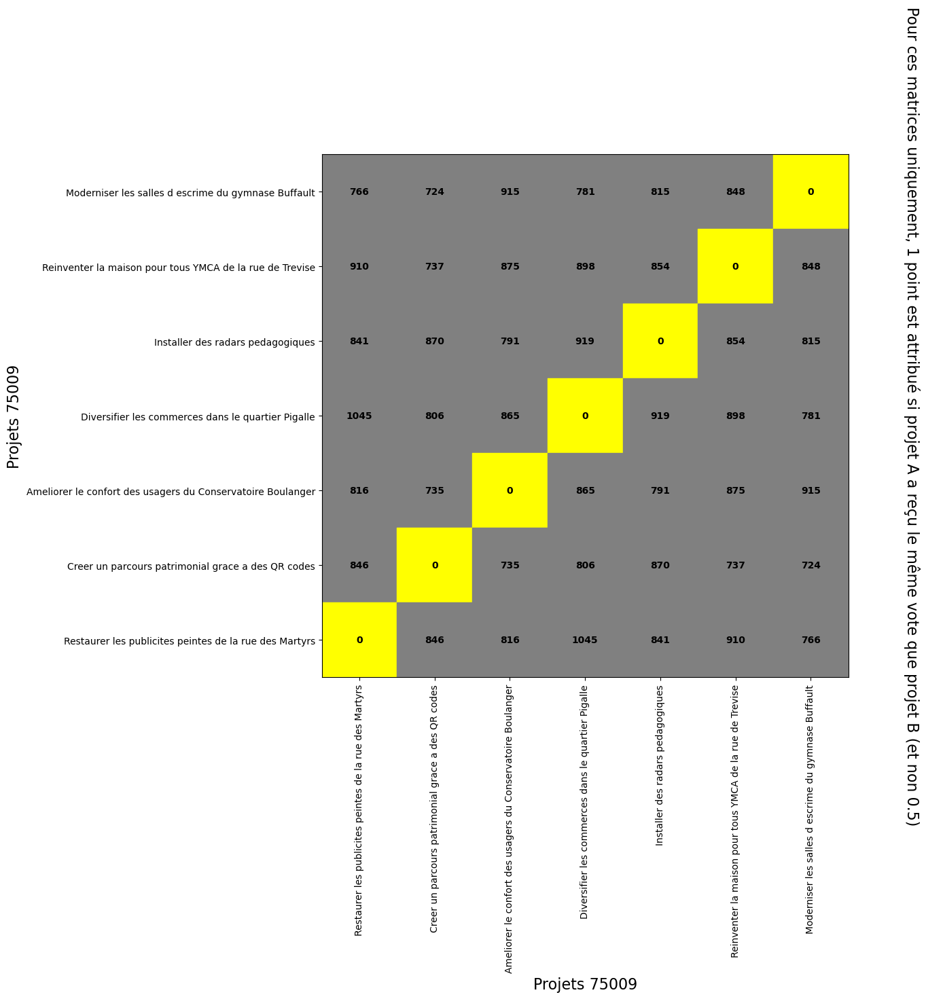

On cherche le gagant de Condorcet ou de Lull pour le : 75010
                                                    Rang  Rang de Condorcet
Aider les sans-abris et lutter contre la precar...     1                  1
Des cours d ecoles et de colleges vegetalisees ...     2                  1
Agrandir le jardin du Chalet et favoriser la bi...     3                  1
Un eco-lieu pour le 10e                                4                  1
Des stationnements pour les velos                      5                  1
Un terrain couvert pour les sportifs du 10eme          6                  1
Les ecoliers du 10e pionniers de l egalite nume...     7                  1
Renovation espace de glisse JEMMAPES                   8                  1
Restaurer les grilles de l eglise Saint-Vincent...     9                  1
Rendre son lustre a la maison des habitant.e.s ...    10                  1
Restauration des decors de l eglise Saint-Marti...    11                  1
Restauration de la Chapelle

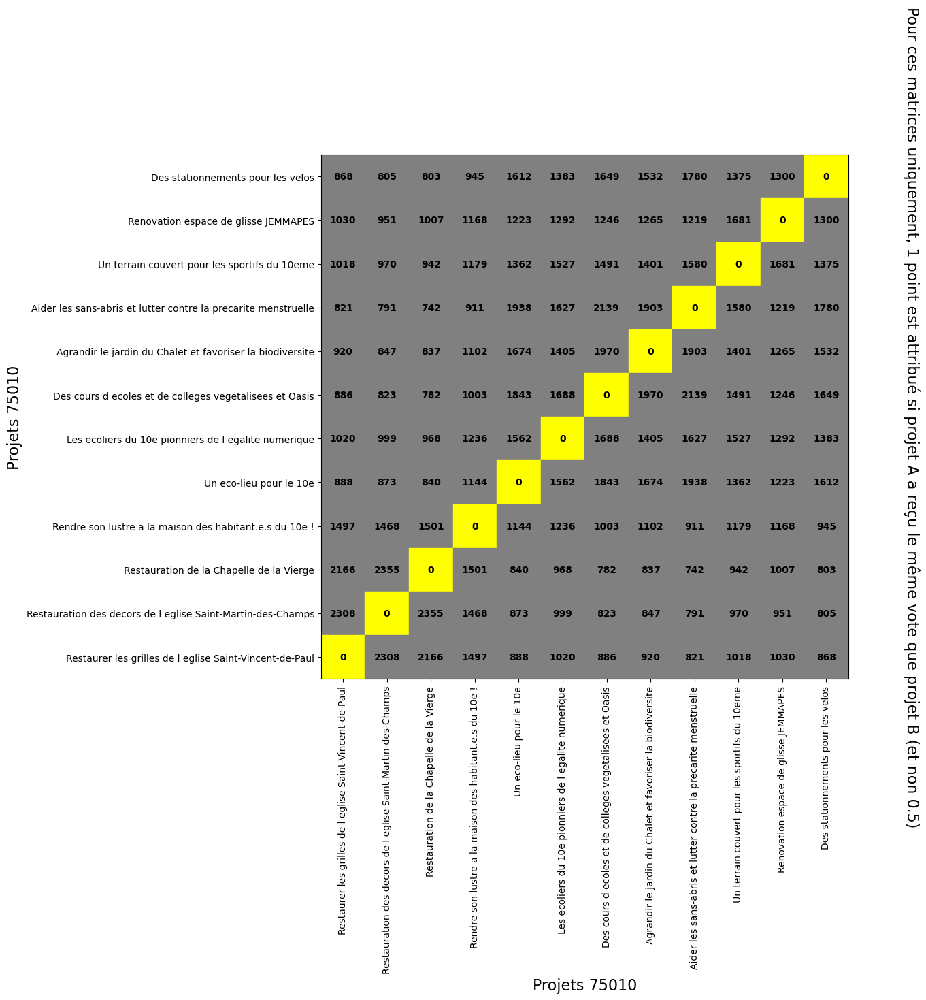

On cherche le gagant de Condorcet ou de Lull pour le : 75011
                                                    Rang  Rang de Condorcet
Rendre le 11e encore plus vert                         1                  1
Apaiser la circulation et partager l espace pub...     2                  1
Amenager et equiper les ecoles du 11e                  3                  1
Equiper les colleges du 11e pour developper les...     4                  1
Innover au service de toutes et tous dans le 11e       5                  1
Ameliorer les equipements sportifs du 11e pour ...     6                  1
Favoriser la vie culturelle du quartier Bellevi...     7                  1
Creer une cour Oasis pour les ecoles Belleville...     8                  1
Embellir le 11e grace a des Åuvres sur les murs       9                  1
Embellir l eglise Saint-Ambroise, patrimoine du...    10                  1


/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


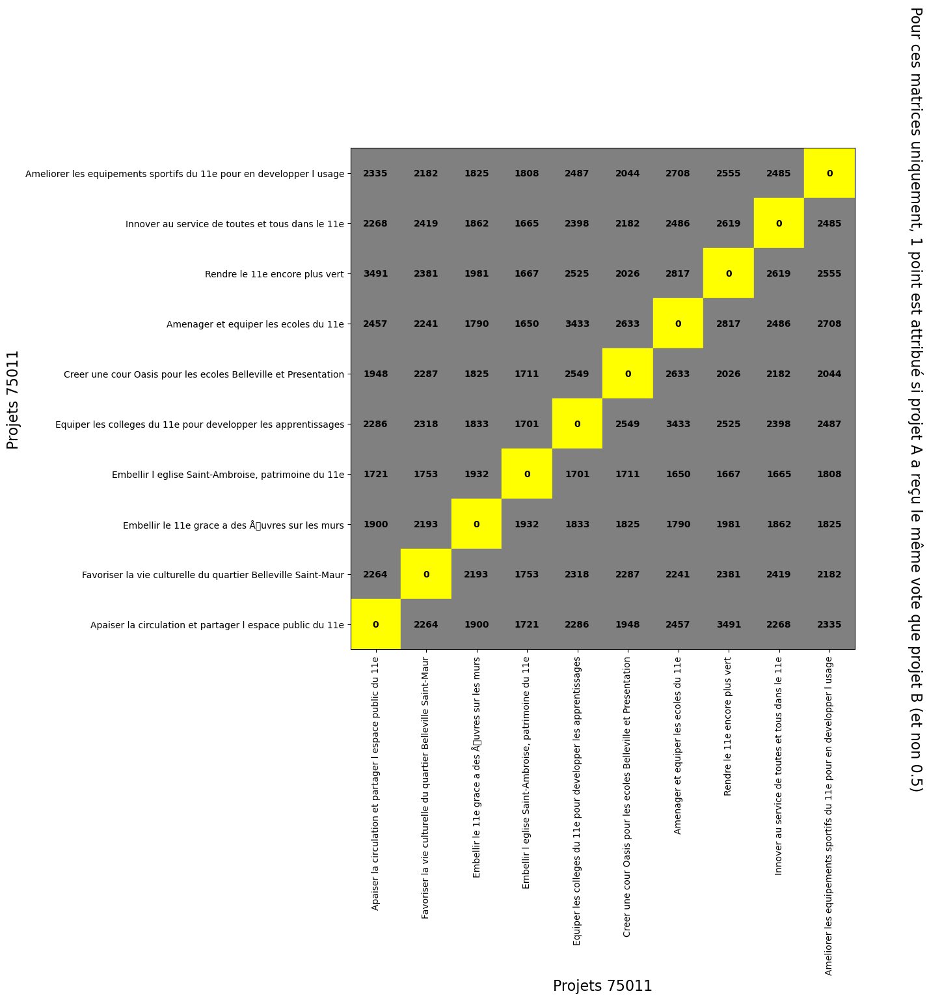

/tmp/ipykernel_592/196671881.py:131: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.savefig("{}.png".format(arrondissement))


On cherche le gagant de Condorcet ou de Lull pour le : 75012
                                                    Rang  Rang de Condorcet
Ameliorer le quotidien des eleves du 12e               1                  1
Sublimer nos squares, parcs et jardins                 2                  1
Faisons du 12e un arrondissement toujours plus ...     3                  1
Renforcer l accessibilite et l inclusivite dans...     4                  1
Faire du 12e un arrondissement plus solidaire          5                  1
Ameliorer l accueil des sportifs dans le 12e ar...     6                  1
Realiser deux amenagements ponctuels et mesurer...     7                  1
Renover nos Terrains dâEducation Physique (TEP)      8                  1
Ameliorer le quotidien des habitantÂ·eÂ·s du qu...     9                  1
Renovons notre Patrimoine                             10                  1
Valoriser les squares du quartier Erard-Rozanoff      11                  1
Restaurer la facade de l eg

/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


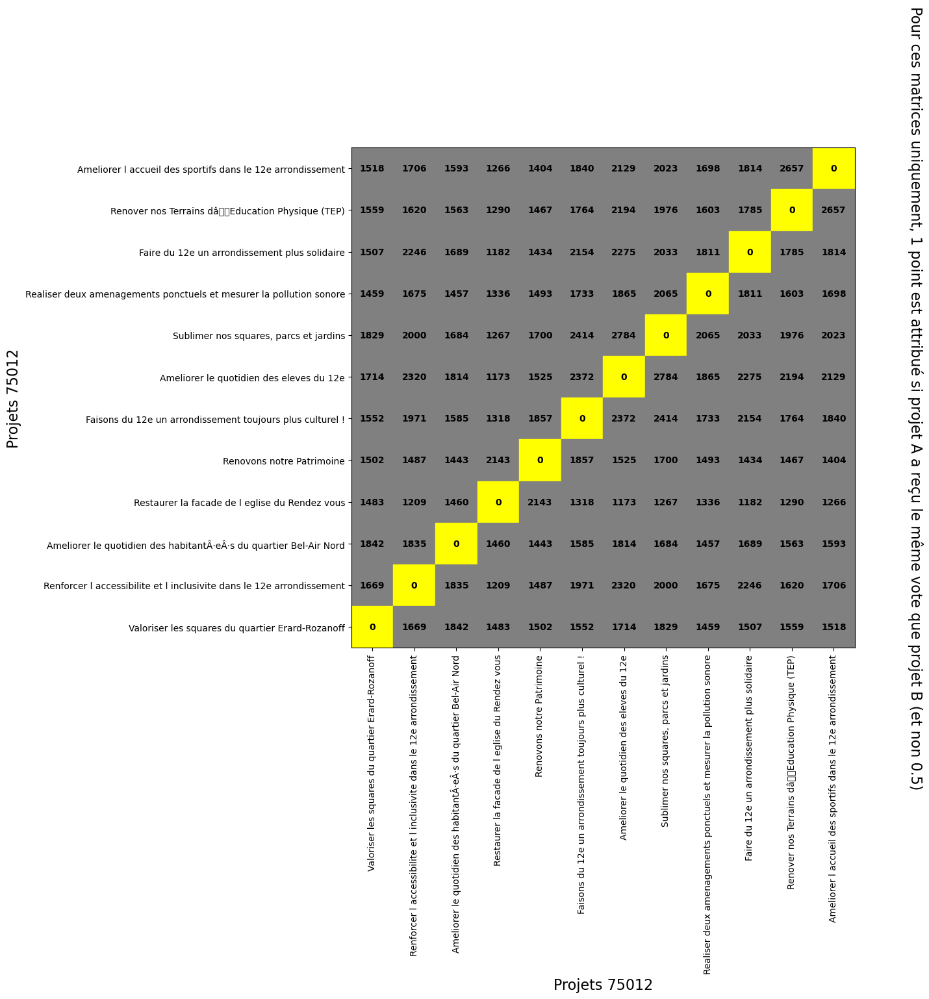

/tmp/ipykernel_592/196671881.py:131: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.savefig("{}.png".format(arrondissement))
/tmp/ipykernel_592/196671881.py:131: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.savefig("{}.png".format(arrondissement))


On cherche le gagant de Condorcet ou de Lull pour le : 75013
                                                    Rang  Rang de Condorcet
Maison des Associations et club-house : se retr...     1                  1
Vegetaliser et rafraichir les cours des ecoles ...     2                  1
La modernisation du centre sportif Georges Carp...     3                  1
Modernisation et renovation de vos Centres Pari...     4                  1
Une activite sportive pour toutes et tous !            5                  1
Vos projets pour ameliorer le cadre de vie dans...     6                  1
Vos micro-quartiers : fresques, jeux, jardins e...     7                  1
Ameliorer l acces aux outils numeriques dans le...     8                  1
Vos projets pour faire du partage une valeur co...     9                  1
De la place pour les animaux au Parc de Choisy ...    10                  1


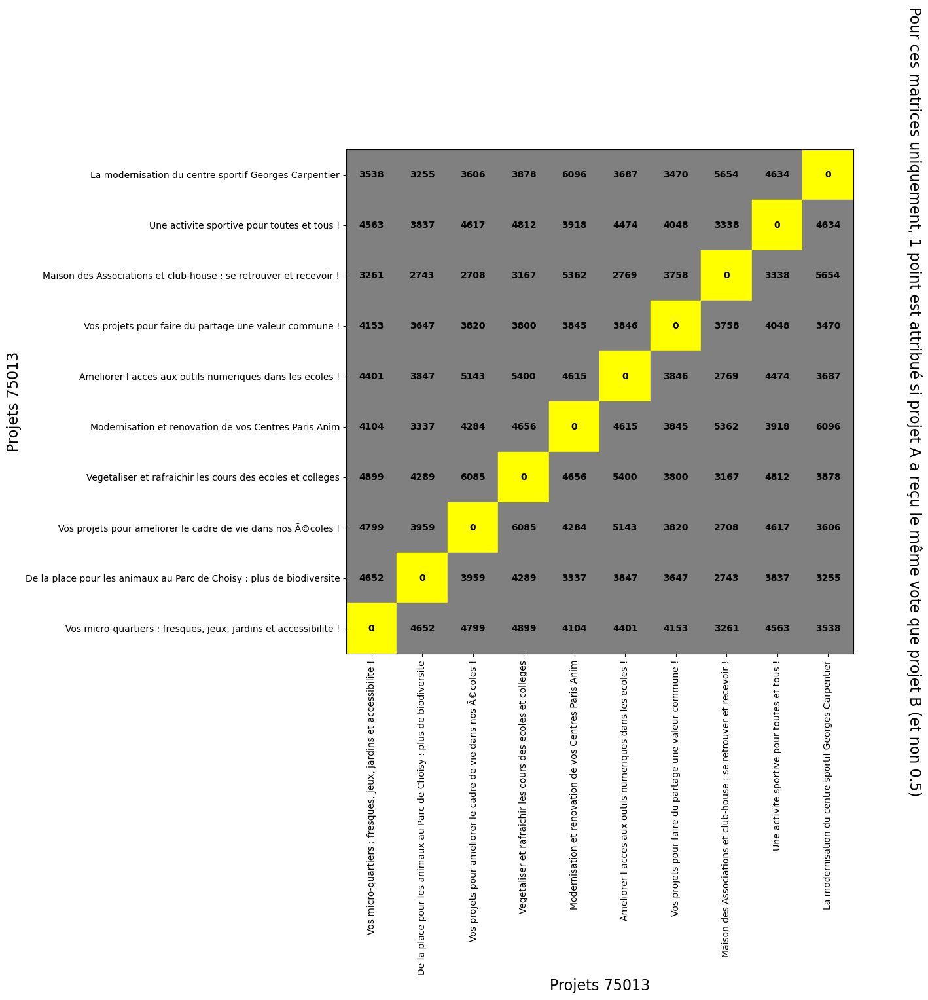

On cherche le gagant de Condorcet ou de Lull pour le : 75014
                                                    Rang  Rang de Condorcet
Adoucir et rafraichir les espaces verts du 14e         1                  1
Ouvrons les ecoles aux enfants extraordinaires !       2                  1
Du matos pour les assoc !                              3                  1
Creons une oasis associative et citoyenne a Por...     4                  1
Un vent de fraicheur sur le patrimoine du 14e          5                  1
Jouons toutes et tous ensemble !                       6                  1
Un musee a ciel ouvert en quartier populaire !         7                  1
La balle est dans votre camp pour plus de sport...     8                  1
Mettre en valeur l Aqueduc Medicis, lieu de pat...     9                  1
Ce serait Elisa Â« bete Â» de jouer au tennis s...    10                  1


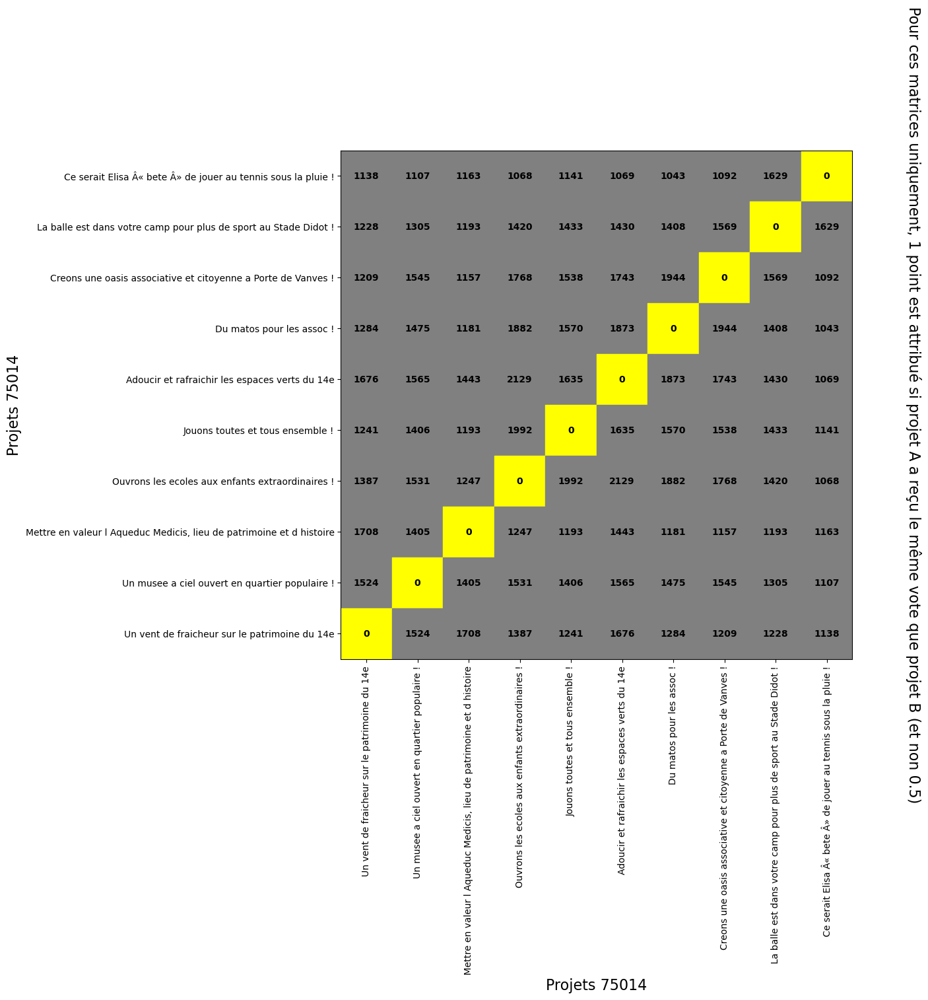

On cherche le gagant de Condorcet ou de Lull pour le : 75015
                                                    Rang  Rang de Condorcet
Un coup de vert dans le 15e                            1                  1
Des cours d ecoles renovees pour le bien-etre d...     2                  1
Favoriser la pratique sportive dans le 15e             3                  1
Un espace public pacifie et adapte a tous              4                  1
Un 15e encore plus solidaire                           5                  1
Restaurons les decors de Saint-Christophe de Javel     6                  1
Un nouvel espace d escalade au centre sportif L...     7                  1
Un cafe des enfants                                    8                  1
Le renouveau des Freres Voisin                         9                  1
Un kit mobile multimedia pour la jeunesse             10                  1
Des tableaux numeriques interactifs dans toutes...    11                  1


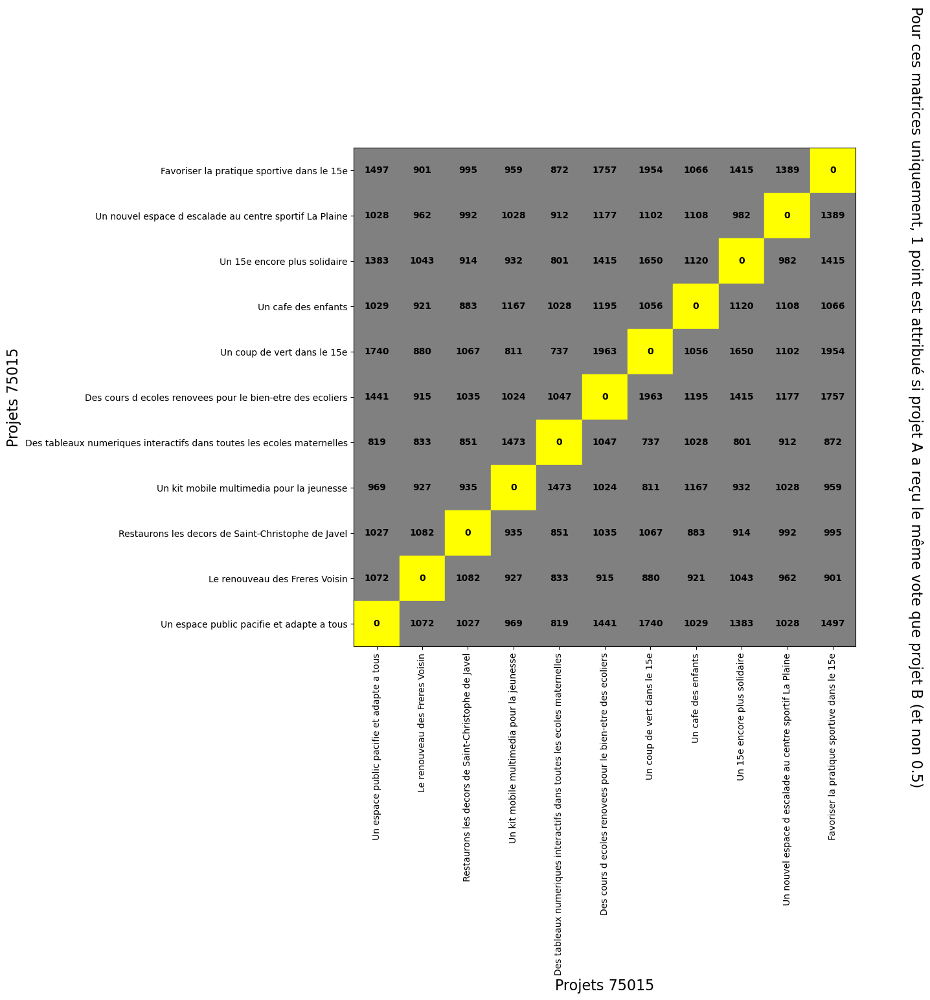

On cherche le gagant de Condorcet ou de Lull pour le : 75016
                                                    Rang  Rang de Condorcet
Ameliorer le cadre de vie dans le Bois de Boulogne     1                  1
Apaiser la circulation automobile dans le 16e          2                  1
Renover le terrain du stade de la Muette               3                  1
Installer des preaux dans deux ecoles du 16e           4                  1
Nettoyer le mur des rampes du Pont de Bir-Hakeim       5                  1
Aider a la renovation du domaine de Bagatelle          6                  1
Nettoyer les murs exterieurs du cimetiere de Passy     7                  1
Restaurer la Fontaine Victor Hugo                      8                  1
Restaurer le monument Claude Debussy                   9                  1
Acquerir un kiosque mobile d informations socia...    10                  1


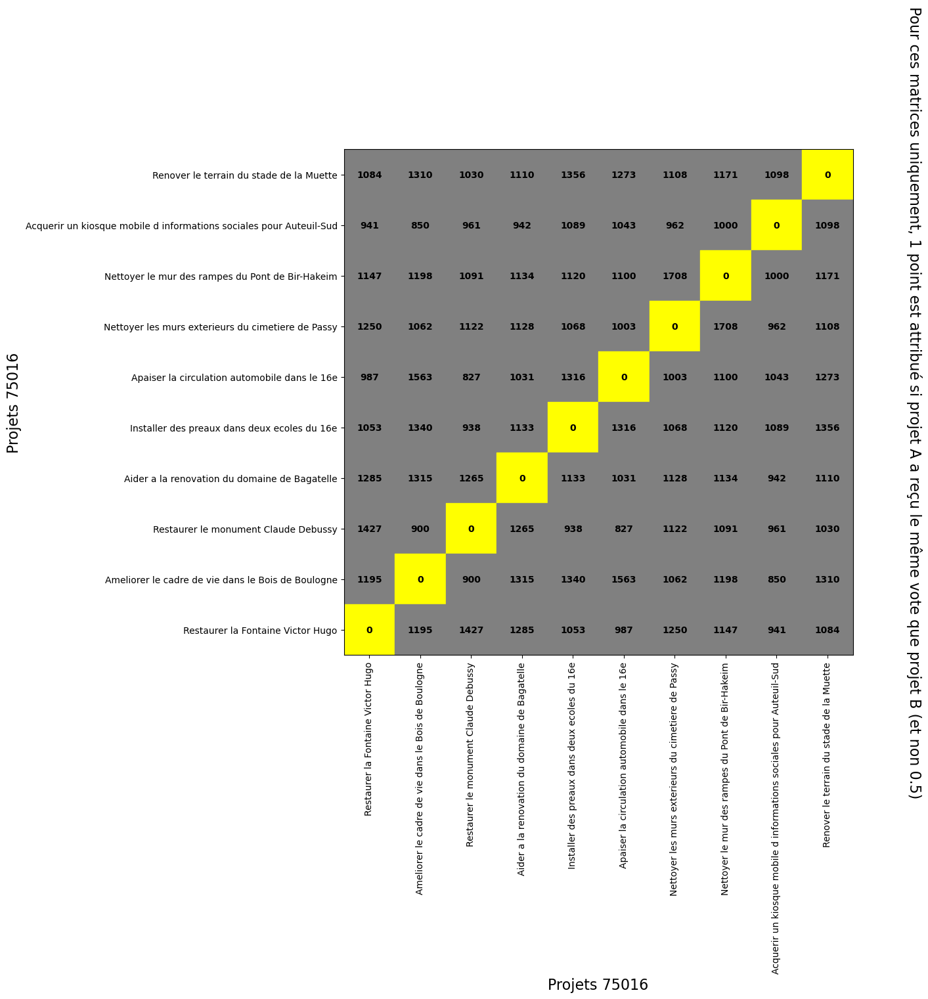

On cherche le gagant de Condorcet ou de Lull pour le : 75017
                                                    Rang  Rang de Condorcet
Vers plus de vert dans le 17eme !                      1                  1
Securiser les carrefours dangereux et les abord...     2                  1
Renovons les ecoles du 17eme !                         3                  1
Velo, velo, velo !                                     4                  1
Patrimoine et memoire : restaurer et valoriser ...     5                  1
Super ! La ressourcerie des familles                   6                  1
Ameliorer les terrains sportifs du 17eme !             7                  1
Des locaux equipes pour un quartier plus solidaire     8                  1
De l art hors les murs !                               9                  1
Renover les marches couverts du 17eme                 10                  1
Renover les gymnases du 17eme !                       11                  1
Refection des trottoirs ave

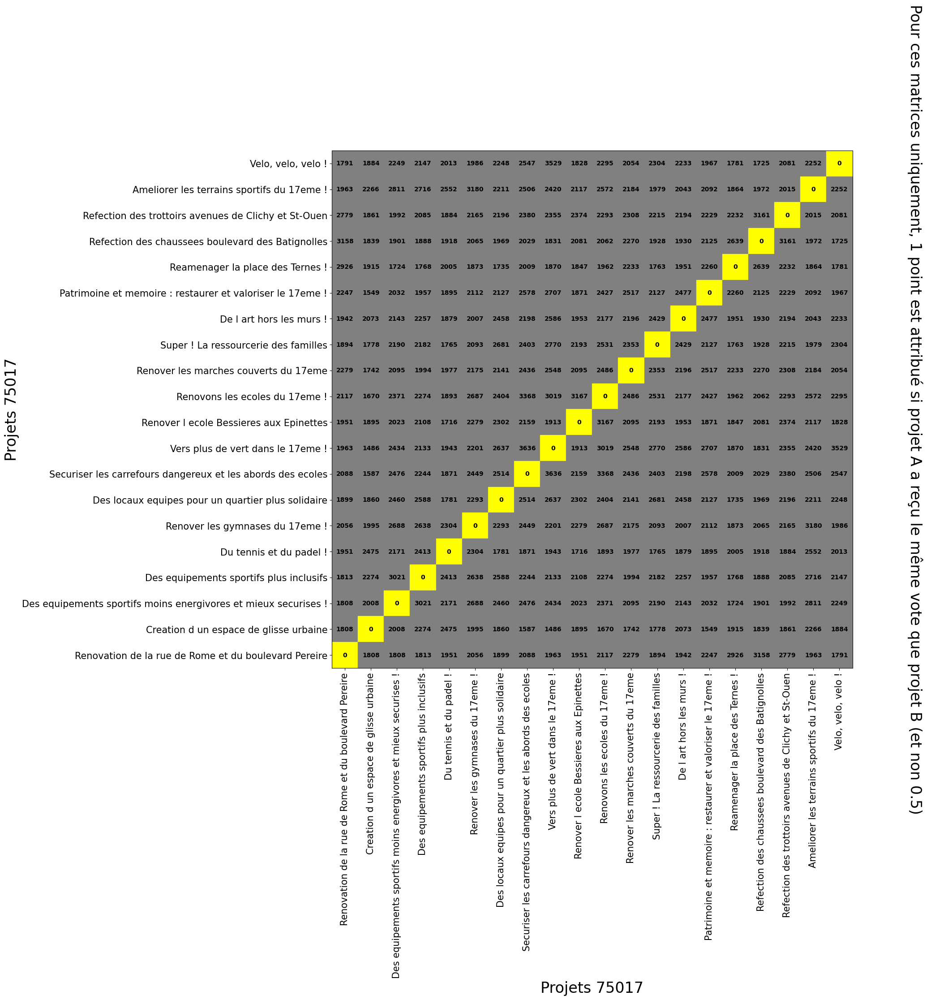

On cherche le gagant de Condorcet ou de Lull pour le : 75018
                                                    Rang  Rang de Condorcet
Vegetaliser l arrondissement et amenager les pa...     1                  1
Vegetaliser et ameliorer les lieux publics dans...     2                  1
Lutter contre les inegalites d acces                   3                  1
Favoriser le lien social et les pratiques artis...     4                  1
Securiser et amenager pour favoriser les mobili...     5                  1
Doter les ecoles du 18e de davantage d outils n...     6                  1
Kits pedagogiques pour parler aux enfants des p...     7                  1
Restaurer le patrimoine cultuel                        8                  1
Creer une ecole des metiers du velo du Grand Paris     9                  1
Mettre en valeur l histoire du quartier La Chap...    10                  1
Mettre de la couleur sur les murs                     11                  1
Mettre en lumiere les monum

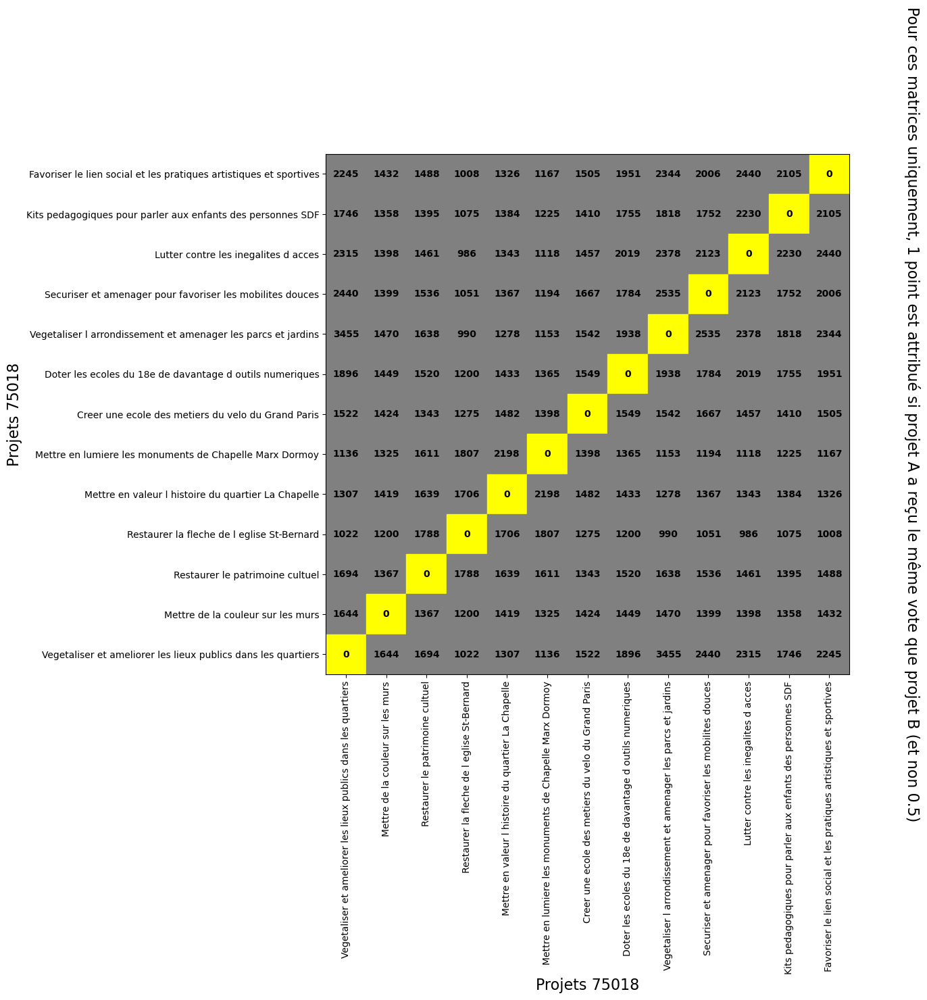

On cherche le gagant de Condorcet ou de Lull pour le : 75019
                                                    Rang  Rang de Condorcet
Modernisons nos equipements pour faire du sport...     1                  1
Destination 2024 : le 19e a l heure du sport           2                  1
Soutenons le dynamisme associatif et solidaire ...     3                  1
Rafraichir la ville et promouvoir la biodiversite      4                  1
Marcher et pedaler en toute securite                   5                  1
Faire vivre l inclusion dans le 19e                    6                  1
Embellir et illuminer les rues et jardins de no...     7                  1
Cours vegetalisees, musique et lecture pour mie...     8                  1
Plus belles nos ecoles : de la nature et du cie...     9                  1
Faciliter les deplacements des pietons et des c...    10                  1
Art, patrimoine et couleur : le 19e plus culturel     11                  1
Developper les stationnemen

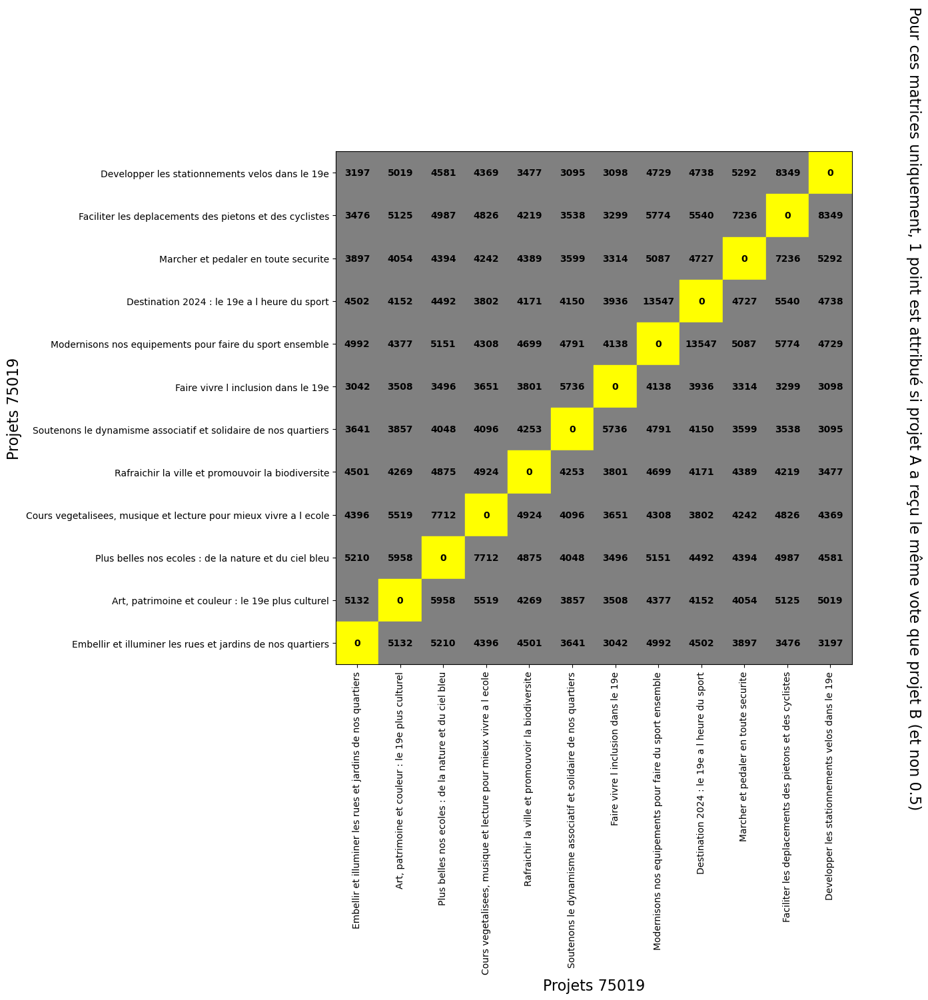

On cherche le gagant de Condorcet ou de Lull pour le : 75020
                                                    Rang  Rang de Condorcet
Amenager des espaces publics verdoyants pour le...     1                  1
Des projets educatifs pour le 20e                      2                  1
Des projets pour la jeunesse du 20e                    3                  1
Amenager et equiper les residences sociales            4                  1
Embellir nos parcs et jardins                          5                  1
Equiper les associations d alimentation durable        6                  1
Poursuivre la restauration de La Fleche d Or : ...     7                  1
Securiser la voirie et apaiser la circulation          8                  1
Embellir le 20e avec des fresques et de la vege...     9                  1
Renovations energetiques pour les ecoles de la ...    10                  1
Restaurer la Maison de l Air pour les habitante...    11                  1


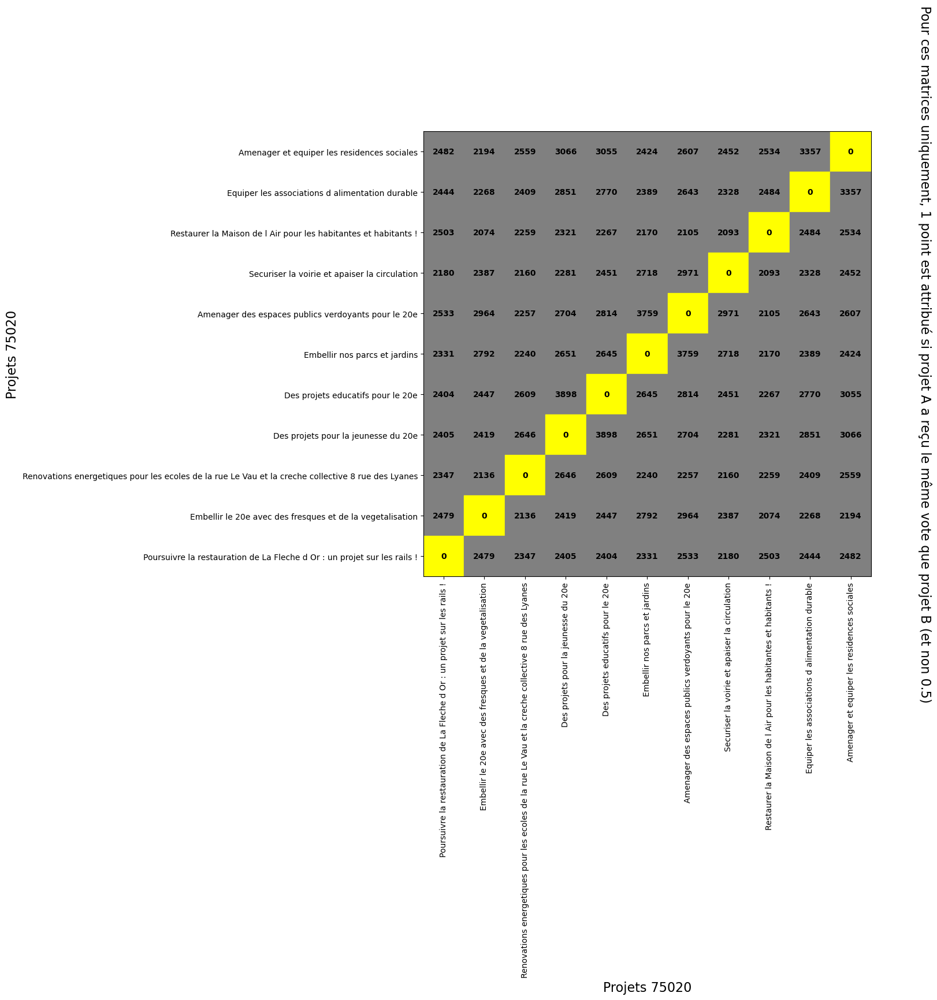

Temps d'exécution : 0:55:49


In [20]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod_A_equals_B(current_df,projets)

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

In [13]:
# Fonction finale pour obtenir la matrice des préférences avec les confrontations indirectes (votes uniques 1 ou 4)

def CondorcetMethod_A_strictly_more_than_B(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] < arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                        elif arr.iloc[User, colonne_i] > arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                            
        # On ajoute les confrontations indirectes :
            # -> un vote pour le projet i contre tous les autres ou un vote unique pour tous les autres que le projet i
        if arr.iloc[User, 4:-6].eq('novote').sum() == (Taille-1):
            for index_i in range(Taille):
                if arr.iloc[User, index_i] == 1:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_j, index_i] += 1
                elif arr.iloc[User, index_i] == 4:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_i, index_j] += 1
                        
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2
    
    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref0 = pd.DataFrame(miroir_pref)
    df_condorcet_pref = df_condorcet_pref0.copy()
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_condorcet)):
        text = ax.text(len(df_condorcet.columns)-(1 if arrondissement != '75005' else 1.6), i+0.5,df_condorcet.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if df_condorcet.iloc[i, j] == 0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

On cherche le gagant de Condorcet ou de Lull pour le : Paris Centre
                                                    Rang  Rang de Condorcet
Ameliorer le confort et l amenagement d etablis...     1                  1
Remplacer et renover les bancs de Paris Centre         2                  2
Rendre l eglise St-Germain l Auxerrois accessib...     3                  3
Poursuivre la refection des chaussees des Grand...     4                  4
Restaurer les fontaines du Theatre Francais            5                  6
Completer la renovation des arcades de la rue d...     6                  5
Vegetaliser temporairement la rue Greneta              7                  7
Restaurer le patrimoine de 3 eglises de Paris C...     8                 10
RÃ©nover le petit tunnel de l ecluse du bassin ...     9                  8
Installer du mobilier urbain sur les berges pou...    10                  9
Restaurer les peintures de 2 eglises et tracer ...    11                 12
Renover les reverber

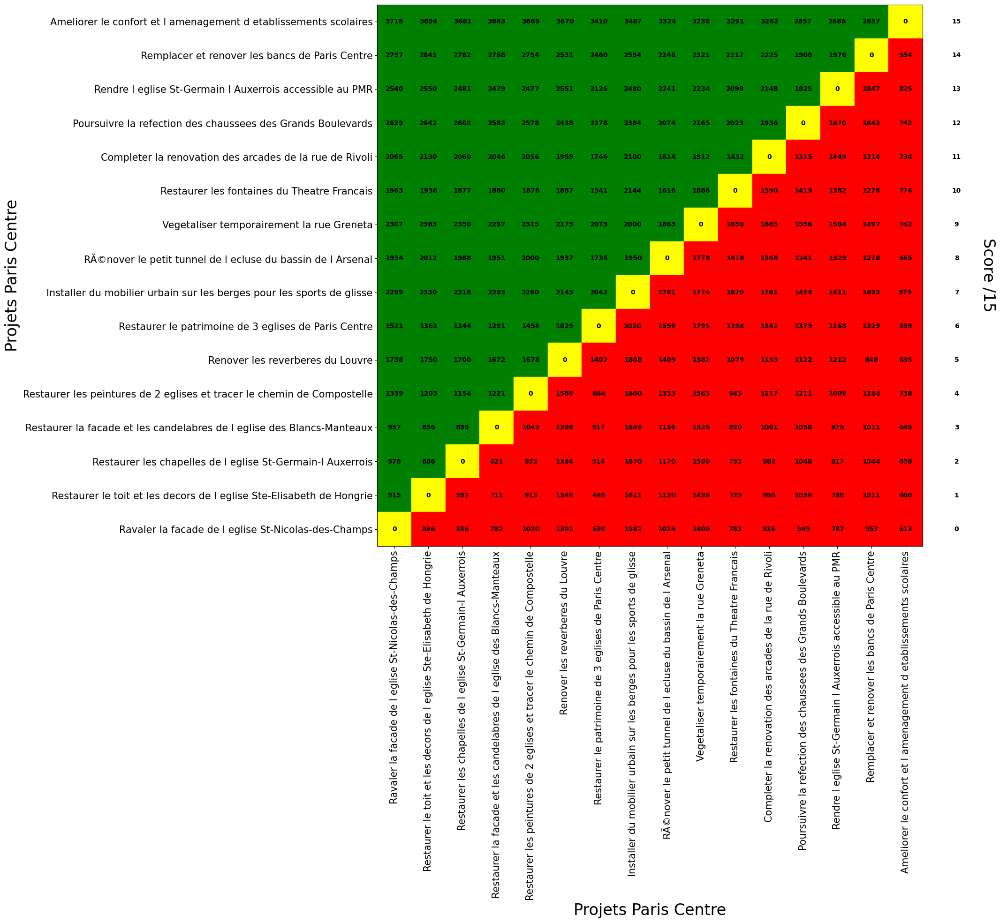

Le gagnant de Condorcet est le projet :  0    Ameliorer le confort et l amenagement d etabli...
Name: 3, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : Tout Paris


/tmp/ipykernel_592/154878140.py:9: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')


                                                    Rang  Rang de Condorcet
Une ville plus belle et plus propre                    1                  1
Des ilots de fraicheurs pour faire face aux can...     2                  2
Des lieux anti-gaspi et solidaires en bas de ch...     3                  5
Plus de biodiversite dans la ville                     4                  3
Des batiments publics plus performants face au ...     5                  4
Des pistes cyclables plus colorees et securisees       6                  6
Du sport pour tous les gouts dans la ville             7                  9
De nouvelles manieres d apprendre pour les enfa...     8                  7
La solidarite en actions dans la ville                 9                  8
De nouveaux outils pour mieux mesurer le bruit ...    10                 10
Le numerique pour toutes et tous                      11                 11
La Pagode du centre sportif Jules Ladoumegue re...    12                 12
De nouveaux 

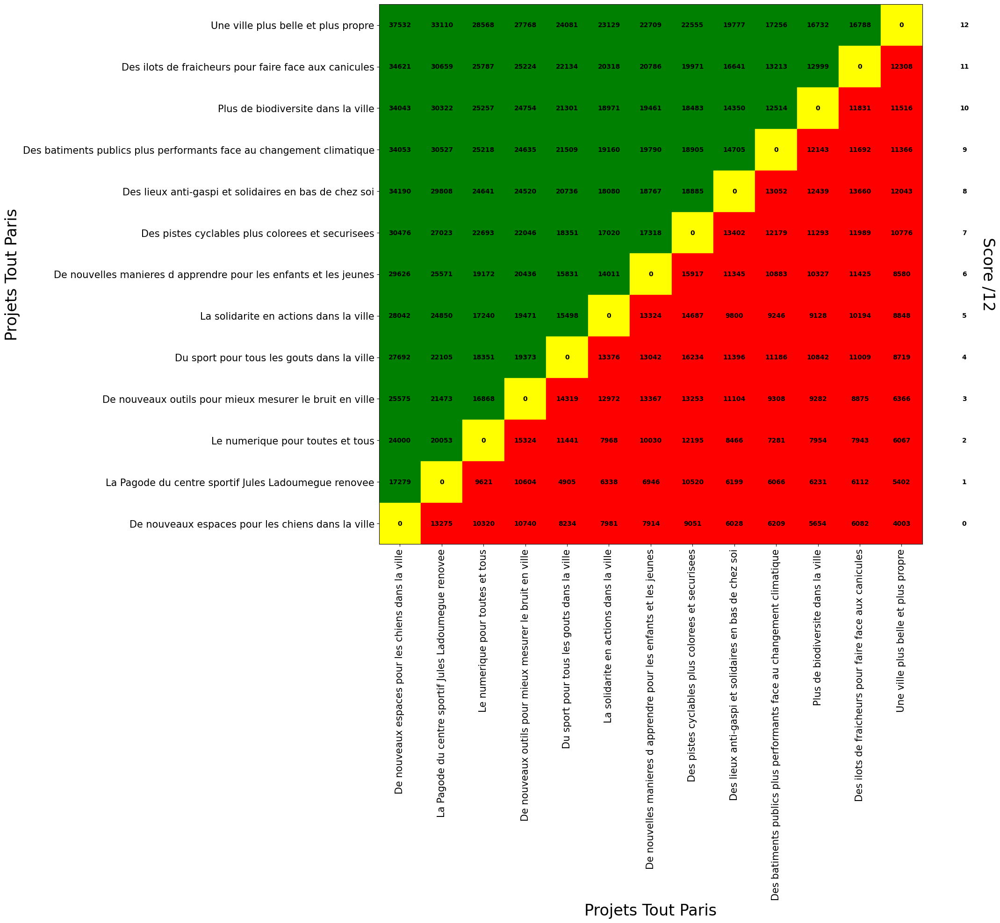

Le gagnant de Condorcet est le projet :  0    Une ville plus belle et plus propre
Name: 6, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75005
                                                    Rang  Rang de Condorcet
Embellir et renover les ecoles du 5e                   1                  1
Fontaines et piscine, plus de fraicheur dans le 5e     2                  2
Humanisation de La Peniche du Coeur                    3                  3
Restaurons les oeuvres d art de nos eglises            4                  5
Apportons une touche de modernite aux lieux de ...     5                  4
Rendre sa splendeur a l eglise Saint-Severin           6                  6


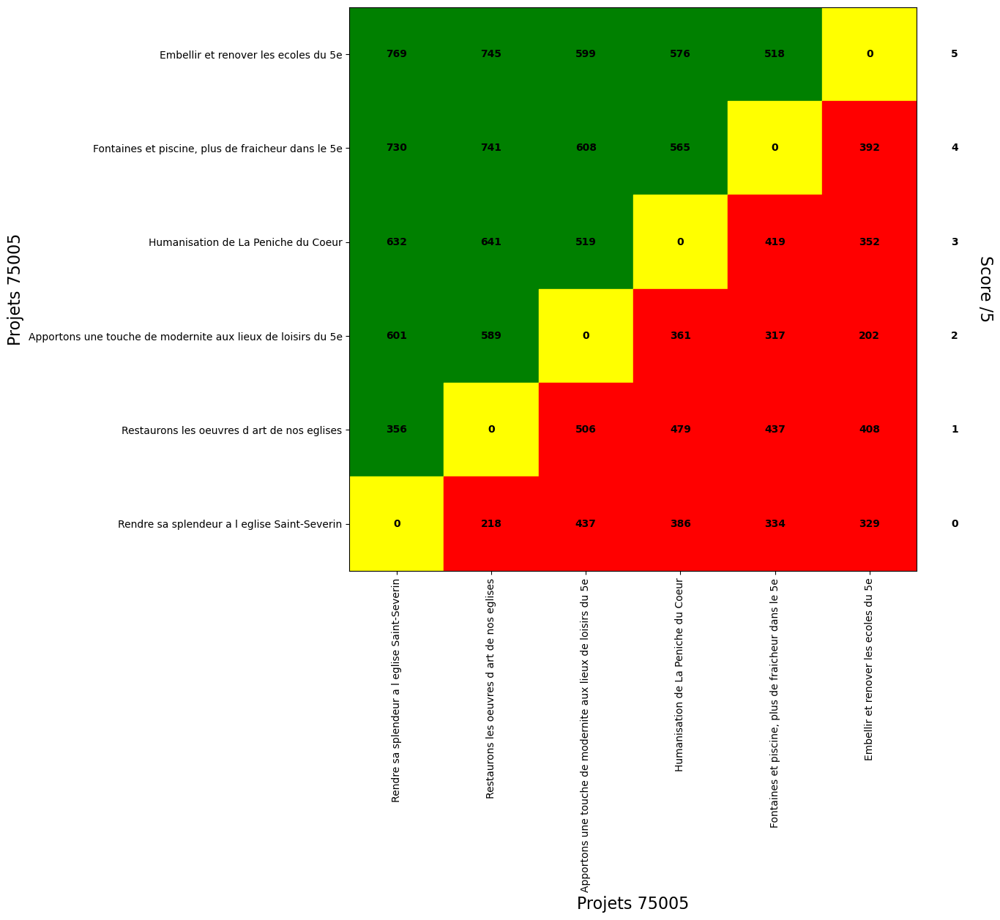

Le gagnant de Condorcet est le projet :  0    Embellir et renover les ecoles du 5e
Name: 2, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75006
                                                    Rang  Rang de Condorcet
Restaurer le patrimoine cultuel et culturel du ...     1                  1
Des videoprojecteurs interactifs pour les ecole...     2                  6
Revelation d un petit jardin - Angle Littre-Vau...     3                  2
Ouverture d un Jardin Partage - Rue du Cherche-...     4                  3
Creer un espace scenique ouvert a tous publics ...     5                  8
Dotation aux ecoles de solution de fraicheur           6                  4
Les jardiniers du Jardinet                             7                  4
Bagagerie solidaire dans le 6e arrondissement          8                  6
Installation de brumisateurs urbains                   9                  9
Un parc d exercice et de detente canin                10                 

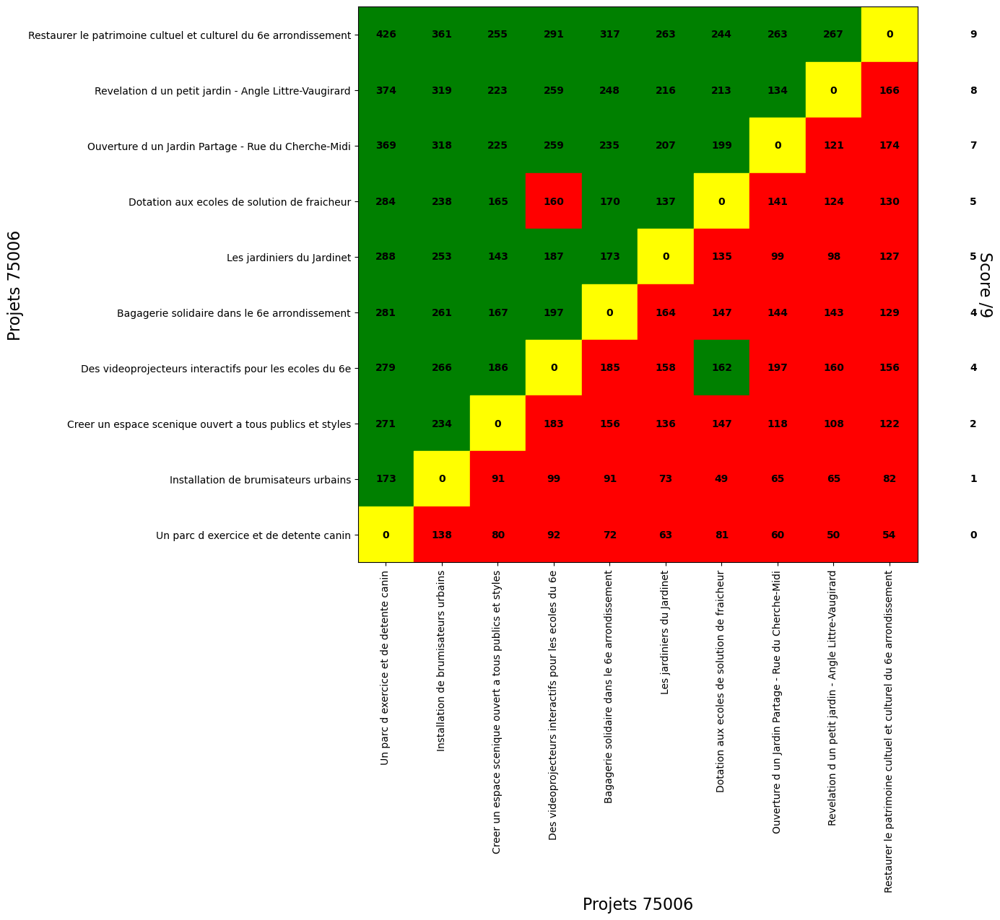

Le gagnant de Condorcet est le projet :  0    Restaurer le patrimoine cultuel et culturel du...
Name: 8, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75007
                                                    Rang  Rang de Condorcet
 Reamenagement des espaces dedies a la jeunesse        1                  2
Restaurer le Champ de Mars et son mobilier hist...     2                  3
Reamenager et equiper les espaces verts du 7e a...     3                  1
Embellir les cours des ecoles du 7e arrondissem...     4                  4
Vegetalisation et equipement de la place Fontenoy      5                  6
Sauvegarde des statues de l arrondissement             6                  5
Restauration des chapelles Sainte-Valere et Sai...     7                  8
ilot refuge pour pietons et velos pont Alexandr...     8                  7
Restaurer la sacristie de l eglise Saint-Thomas...     9                  9
Restauration du temple de Pentemont                   10    

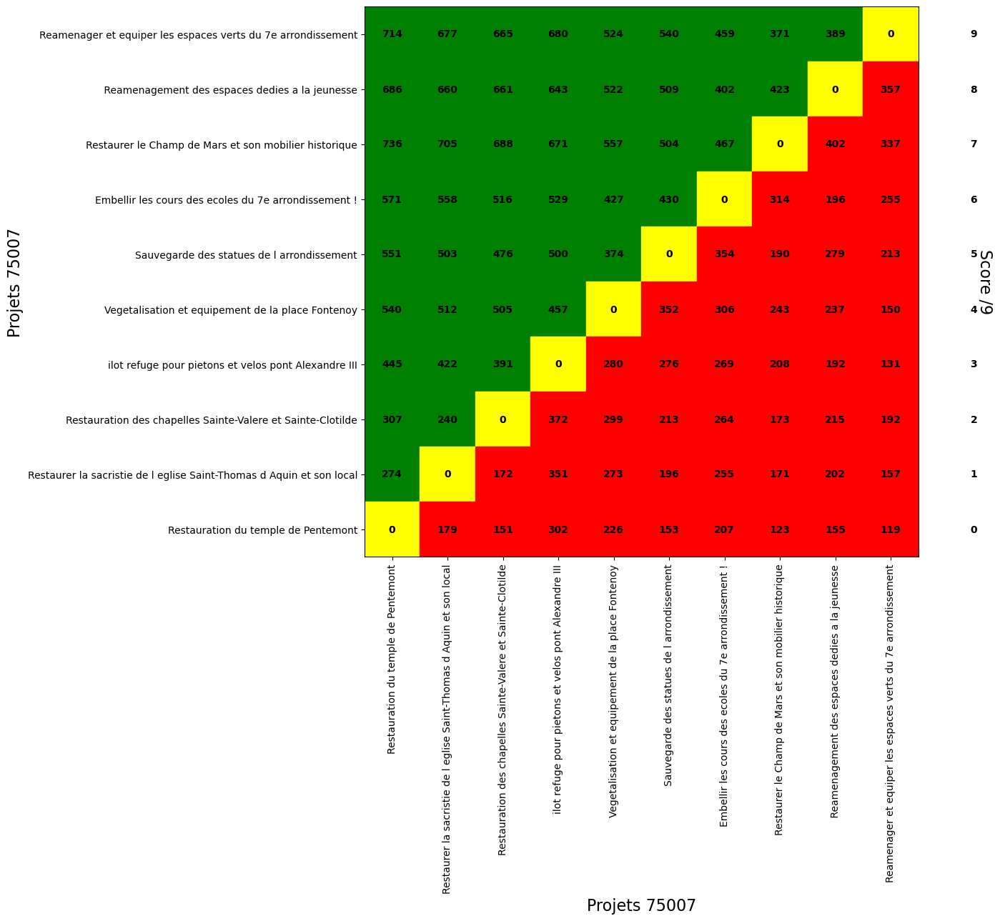

Le gagnant de Condorcet est le projet :  0    Reamenager et equiper les espaces verts du 7e ...
Name: 1, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75008
                                                    Rang  Rang de Condorcet
Apaiser, vegetaliser des rues et places de l ar...     1                  1
Proteger les pietons et reduire les nuisances s...     2                  2
Poursuivre le renouveau du parc Monceau                3                  3
Developper le commerce de proximite dans le qua...     4                  4
Renover le marche aux fleurs de la Madeleine et...     5                  5
Restaurer la facade ouest de l eglise de la Mad...     6                  6
Restaurer le patrimoine de la place de la Concorde     7                  7
Restaurer les grilles emblematiques du parc Mon...     8                  8
Restaurer les grilles emblematiques du parc Mon...     9                  9
Restaurer les grilles emblematiques du parc Mon...    10    

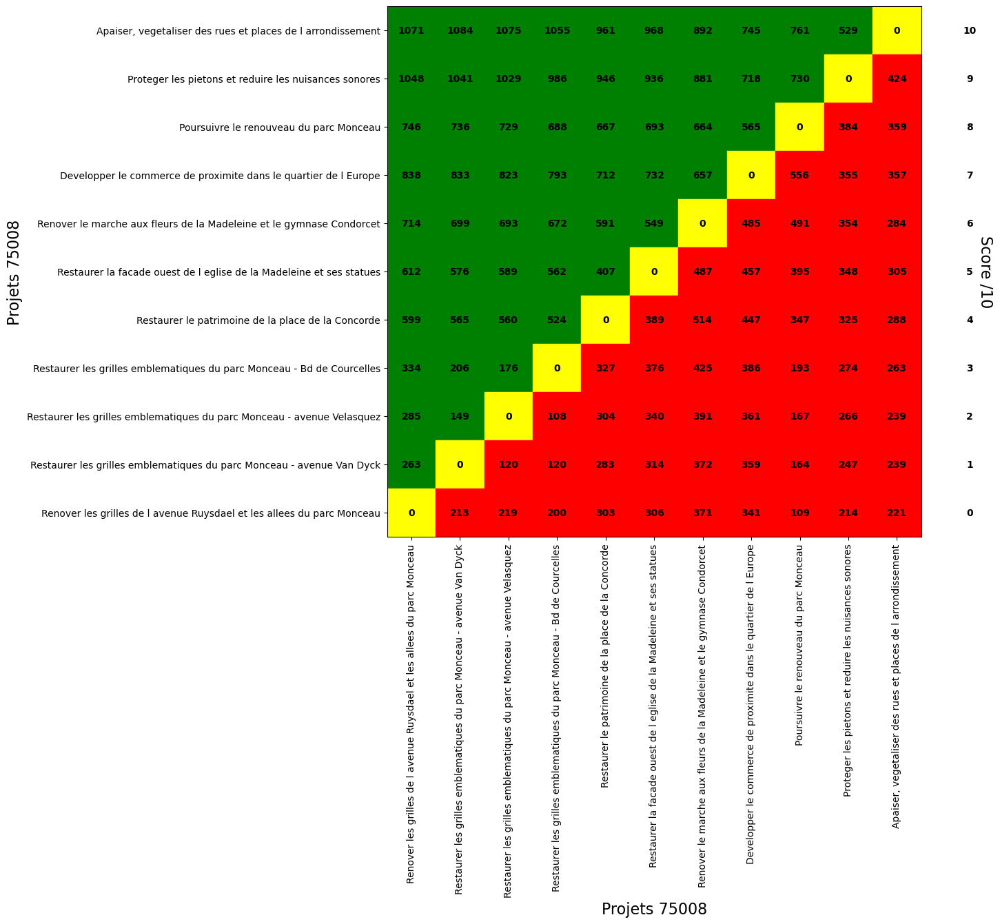

Le gagnant de Condorcet est le projet :  0    Apaiser, vegetaliser des rues et places de l a...
Name: 9, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75009
                                                    Rang  Rang de Condorcet
Reinventer la maison pour tous YMCA de la rue d...     1                  1
Diversifier les commerces dans le quartier Pigalle     2                  2
Restaurer les publicites peintes de la rue des ...     3                  3
Ameliorer le confort des usagers du Conservatoi...     4                  4
Installer des radars pedagogiques                      5                  6
Moderniser les salles d escrime du gymnase Buff...     6                  5
Creer un parcours patrimonial grace a des QR codes     7                  7


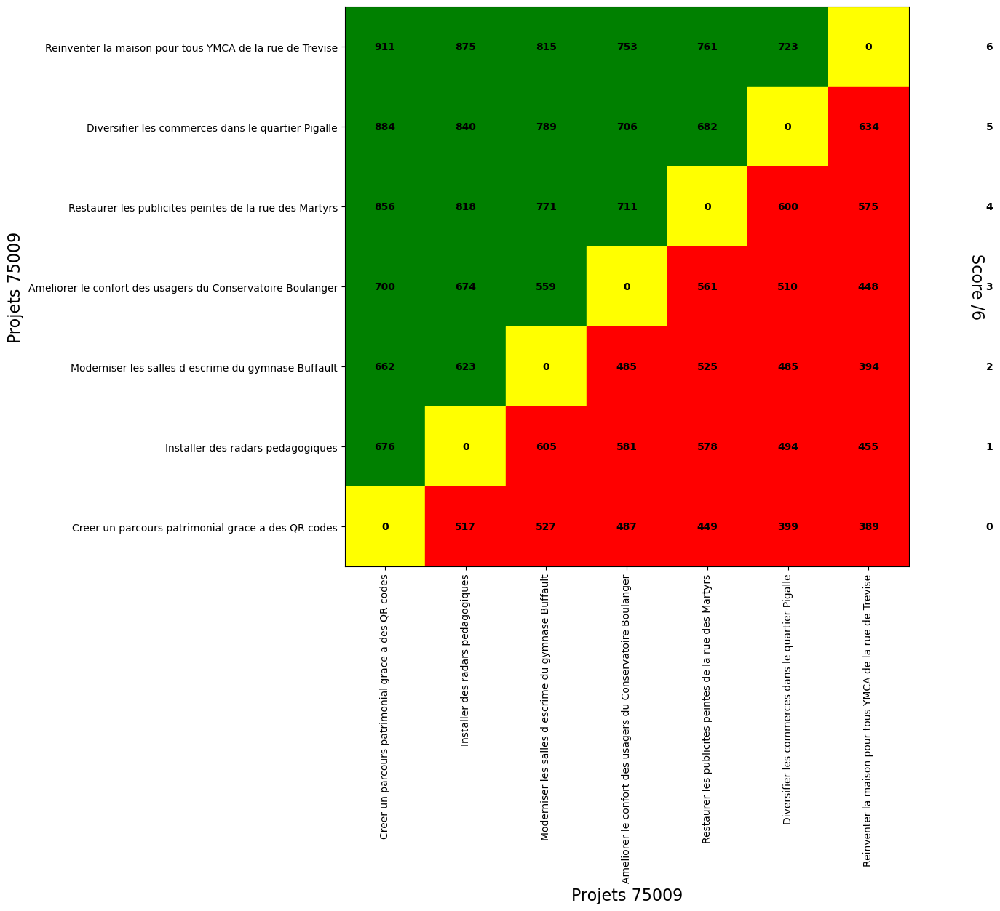

Le gagnant de Condorcet est le projet :  0    Reinventer la maison pour tous YMCA de la rue ...
Name: 1, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75010
                                                    Rang  Rang de Condorcet
Aider les sans-abris et lutter contre la precar...     1                  1
Des cours d ecoles et de colleges vegetalisees ...     2                  2
Agrandir le jardin du Chalet et favoriser la bi...     3                  3
Un eco-lieu pour le 10e                                4                  4
Des stationnements pour les velos                      5                  5
Un terrain couvert pour les sportifs du 10eme          6                  6
Les ecoliers du 10e pionniers de l egalite nume...     7                  7
Renovation espace de glisse JEMMAPES                   8                  8
Restaurer les grilles de l eglise Saint-Vincent...     9                 10
Rendre son lustre a la maison des habitant.e.s ...    10    

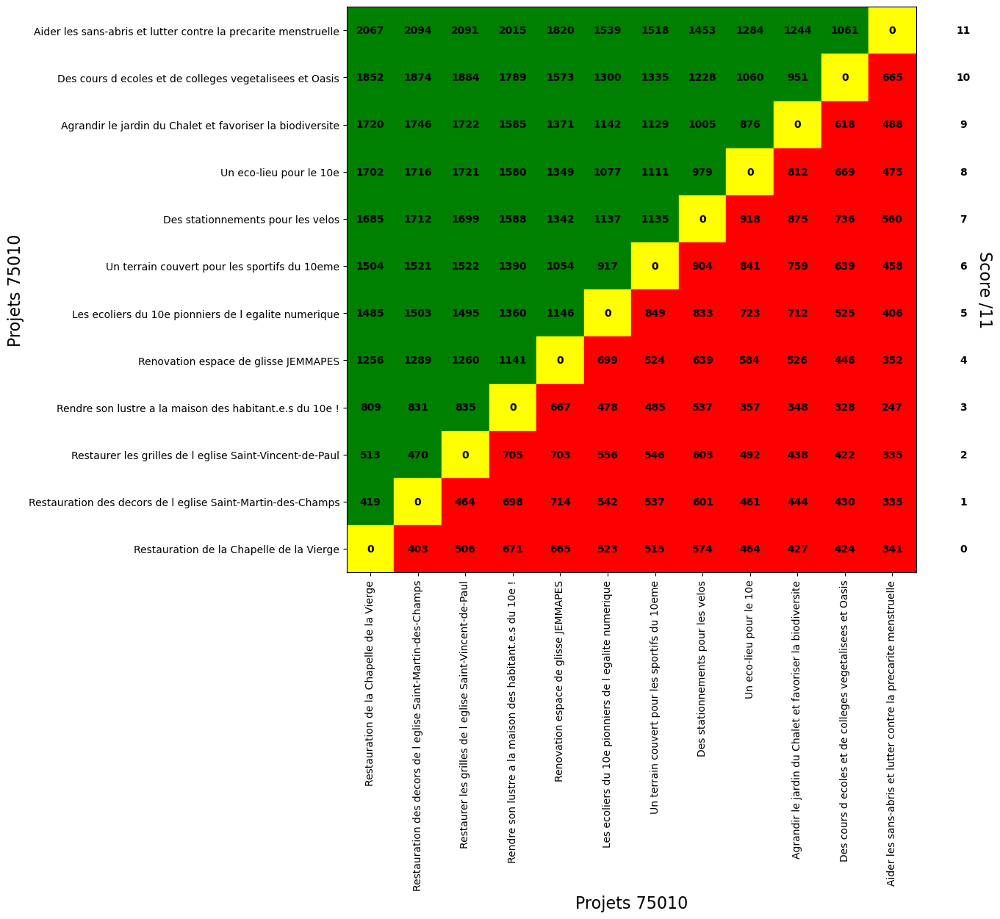

Le gagnant de Condorcet est le projet :  0    Aider les sans-abris et lutter contre la preca...
Name: 3, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75011
                                                    Rang  Rang de Condorcet
Rendre le 11e encore plus vert                         1                  1
Apaiser la circulation et partager l espace pub...     2                  3
Amenager et equiper les ecoles du 11e                  3                  2
Equiper les colleges du 11e pour developper les...     4                  4
Innover au service de toutes et tous dans le 11e       5                  5
Ameliorer les equipements sportifs du 11e pour ...     6                  6
Favoriser la vie culturelle du quartier Bellevi...     7                  7
Creer une cour Oasis pour les ecoles Belleville...     8                  8
Embellir le 11e grace a des Åuvres sur les murs       9                  9
Embellir l eglise Saint-Ambroise, patrimoine du...    10    

/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


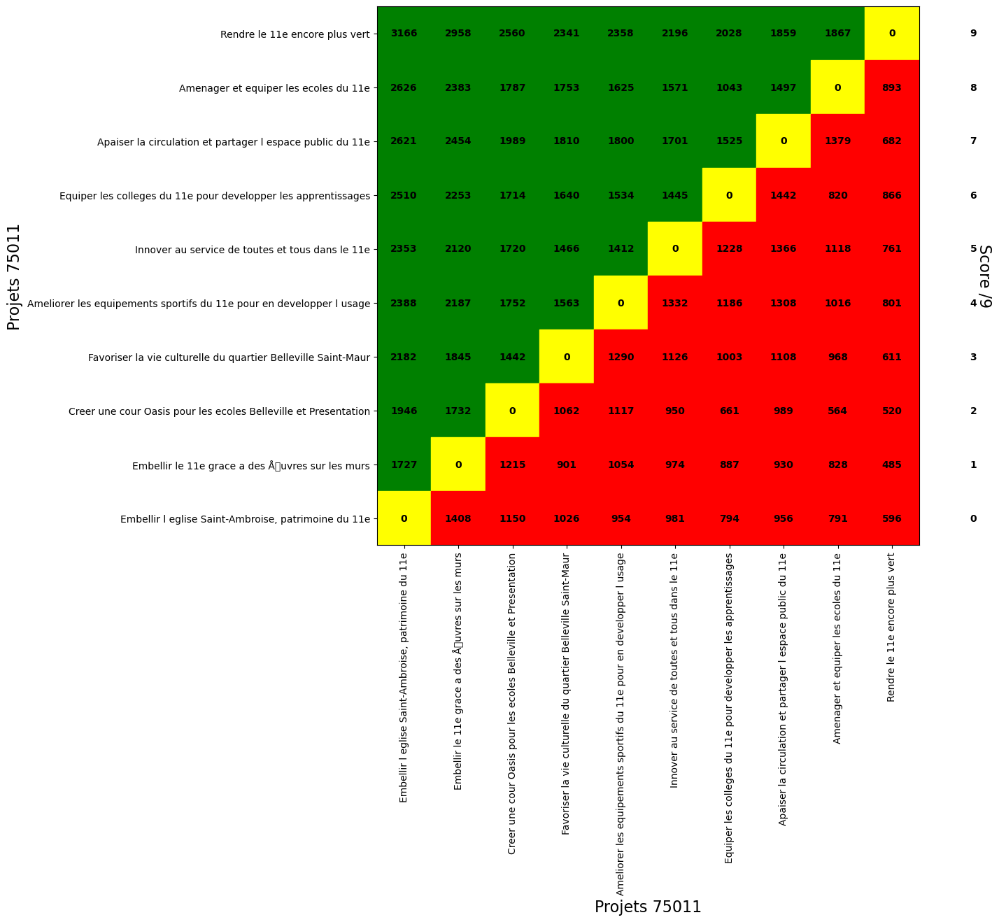

/tmp/ipykernel_592/855335603.py:150: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.savefig("{}.png".format(arrondissement))


Le gagnant de Condorcet est le projet :  0    Rendre le 11e encore plus vert
Name: 2, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75012
                                                    Rang  Rang de Condorcet
Ameliorer le quotidien des eleves du 12e               1                  1
Sublimer nos squares, parcs et jardins                 2                  2
Faisons du 12e un arrondissement toujours plus ...     3                  3
Renforcer l accessibilite et l inclusivite dans...     4                  4
Faire du 12e un arrondissement plus solidaire          5                  5
Ameliorer l accueil des sportifs dans le 12e ar...     6                  7
Realiser deux amenagements ponctuels et mesurer...     7                  8
Renover nos Terrains dâEducation Physique (TEP)      8                  6
Ameliorer le quotidien des habitantÂ·eÂ·s du qu...     9                 10
Renovons notre Patrimoine                             10                  9
Val

/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/mamba/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


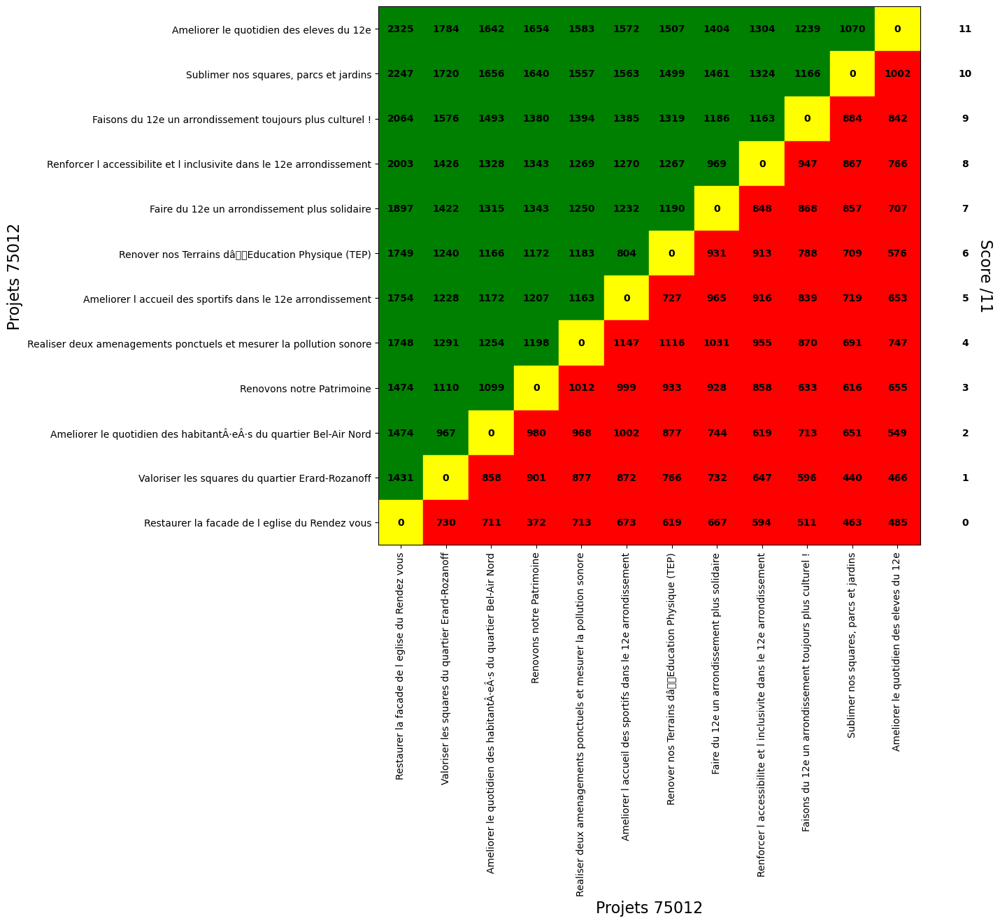

/tmp/ipykernel_592/855335603.py:150: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.savefig("{}.png".format(arrondissement))
/tmp/ipykernel_592/855335603.py:150: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.savefig("{}.png".format(arrondissement))


Le gagnant de Condorcet est le projet :  0    Ameliorer le quotidien des eleves du 12e
Name: 5, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75013
                                                    Rang  Rang de Condorcet
Maison des Associations et club-house : se retr...     1                  2
Vegetaliser et rafraichir les cours des ecoles ...     2                  1
La modernisation du centre sportif Georges Carp...     3                  5
Modernisation et renovation de vos Centres Pari...     4                  8
Une activite sportive pour toutes et tous !            5                  2
Vos projets pour ameliorer le cadre de vie dans...     6                  2
Vos micro-quartiers : fresques, jeux, jardins e...     7                  6
Ameliorer l acces aux outils numeriques dans le...     8                  7
Vos projets pour faire du partage une valeur co...     9                  9
De la place pour les animaux au Parc de Choisy ...    10             

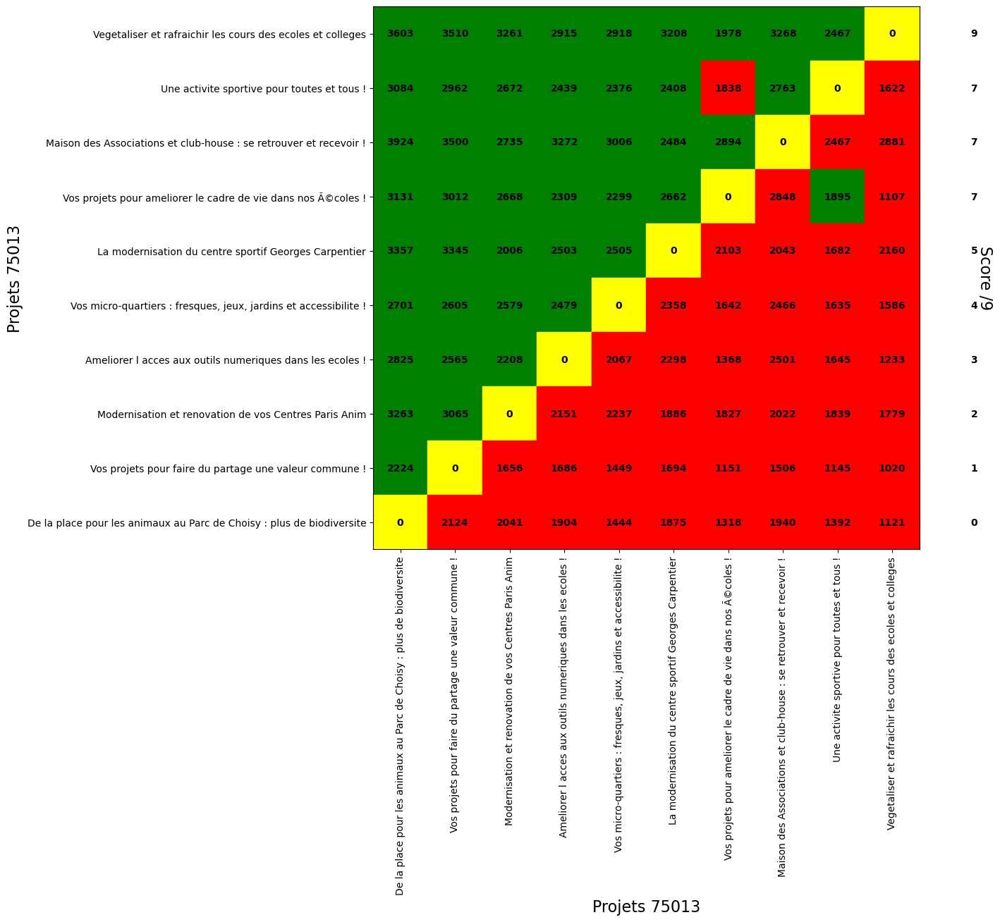

Le gagnant de Condorcet est le projet :  0    Vegetaliser et rafraichir les cours des ecoles...
Name: 6, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75014
                                                    Rang  Rang de Condorcet
Adoucir et rafraichir les espaces verts du 14e         1                  1
Ouvrons les ecoles aux enfants extraordinaires !       2                  2
Du matos pour les assoc !                              3                  3
Creons une oasis associative et citoyenne a Por...     4                  5
Un vent de fraicheur sur le patrimoine du 14e          5                  6
Jouons toutes et tous ensemble !                       6                  4
Un musee a ciel ouvert en quartier populaire !         7                  7
La balle est dans votre camp pour plus de sport...     8                  9
Mettre en valeur l Aqueduc Medicis, lieu de pat...     9                  8
Ce serait Elisa Â« bete Â» de jouer au tennis s...    10    

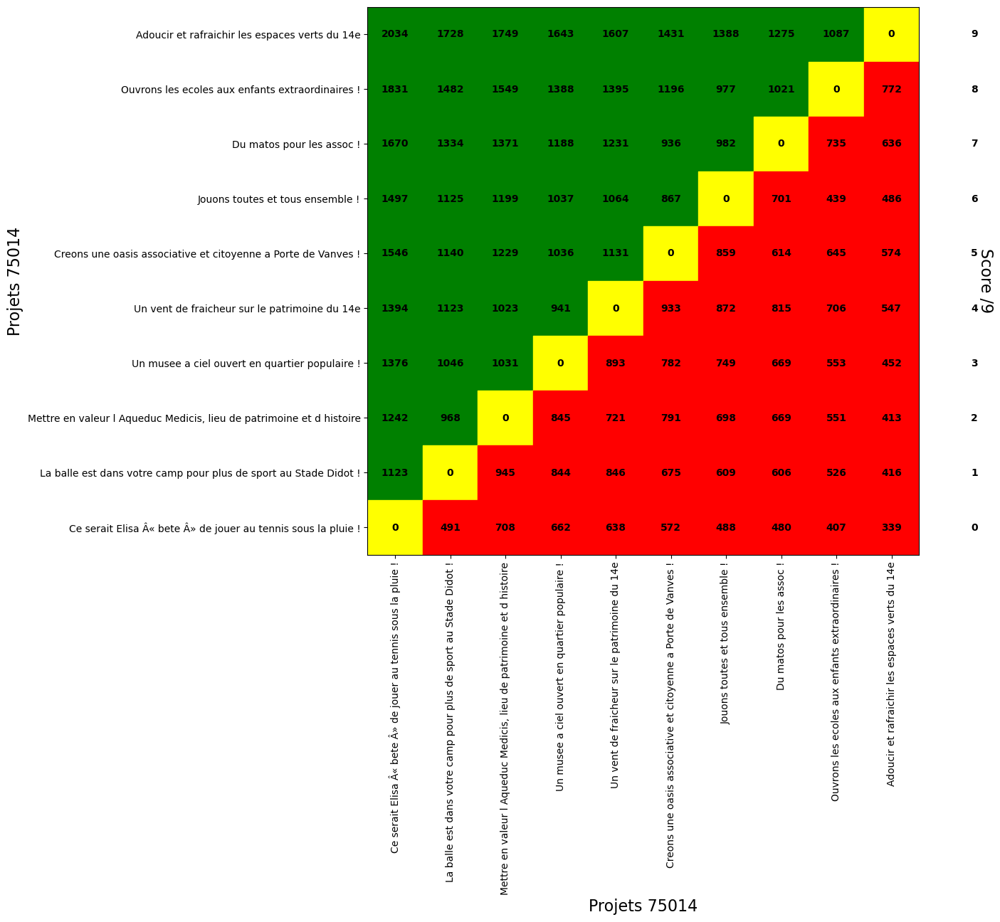

Le gagnant de Condorcet est le projet :  0    Adoucir et rafraichir les espaces verts du 14e
Name: 4, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75015
                                                    Rang  Rang de Condorcet
Un coup de vert dans le 15e                            1                  1
Des cours d ecoles renovees pour le bien-etre d...     2                  2
Favoriser la pratique sportive dans le 15e             3                  3
Un espace public pacifie et adapte a tous              4                  4
Un 15e encore plus solidaire                           5                  5
Restaurons les decors de Saint-Christophe de Javel     6                  7
Un nouvel espace d escalade au centre sportif L...     7                  6
Un cafe des enfants                                    8                  8
Le renouveau des Freres Voisin                         9                  9
Un kit mobile multimedia pour la jeunesse             10       

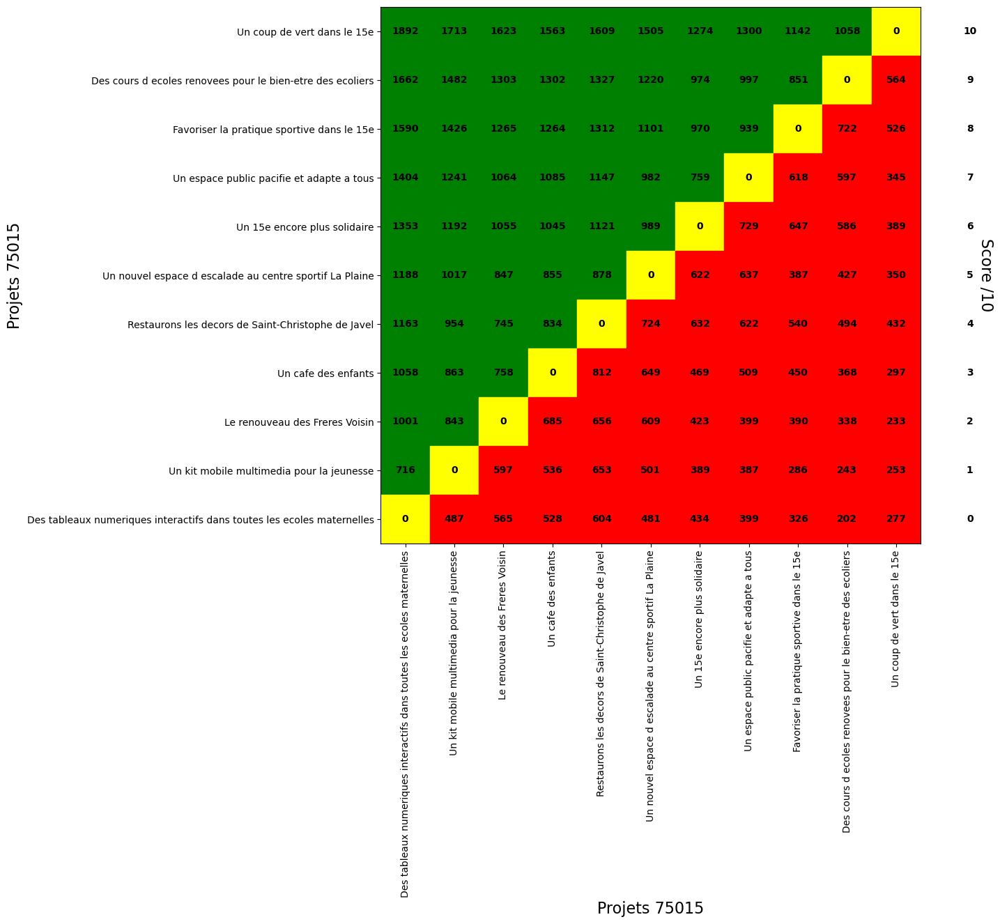

Le gagnant de Condorcet est le projet :  0    Un coup de vert dans le 15e
Name: 4, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75016
                                                    Rang  Rang de Condorcet
Ameliorer le cadre de vie dans le Bois de Boulogne     1                  1
Apaiser la circulation automobile dans le 16e          2                  2
Renover le terrain du stade de la Muette               3                  4
Installer des preaux dans deux ecoles du 16e           4                  3
Nettoyer le mur des rampes du Pont de Bir-Hakeim       5                  5
Aider a la renovation du domaine de Bagatelle          6                  6
Nettoyer les murs exterieurs du cimetiere de Passy     7                  7
Restaurer la Fontaine Victor Hugo                      8                  8
Restaurer le monument Claude Debussy                   9                  9
Acquerir un kiosque mobile d informations socia...    10                 10


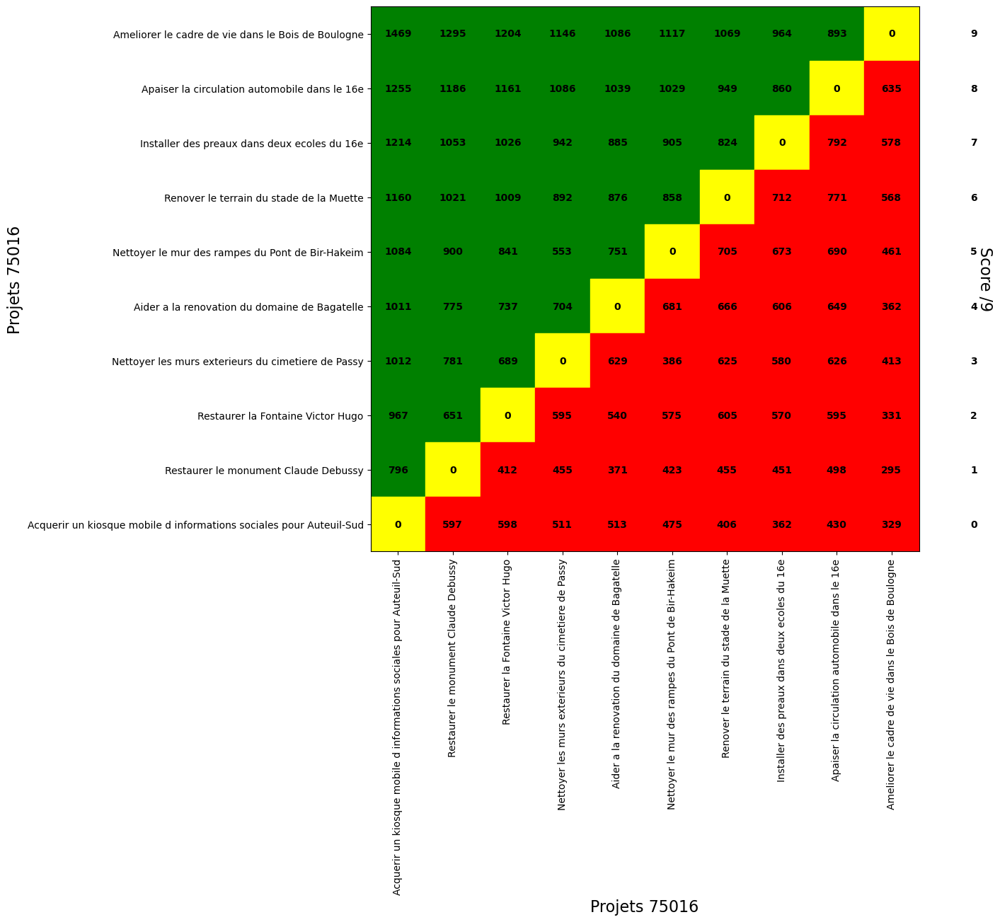

Le gagnant de Condorcet est le projet :  0    Ameliorer le cadre de vie dans le Bois de Boul...
Name: 8, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75017
                                                    Rang  Rang de Condorcet
Vers plus de vert dans le 17eme !                      1                  1
Securiser les carrefours dangereux et les abord...     2                  2
Renovons les ecoles du 17eme !                         3                  3
Velo, velo, velo !                                     4                  5
Patrimoine et memoire : restaurer et valoriser ...     5                  4
Super ! La ressourcerie des familles                   6                  6
Ameliorer les terrains sportifs du 17eme !             7                  8
Des locaux equipes pour un quartier plus solidaire     8                  9
De l art hors les murs !                               9                 13
Renover les marches couverts du 17eme                 10    

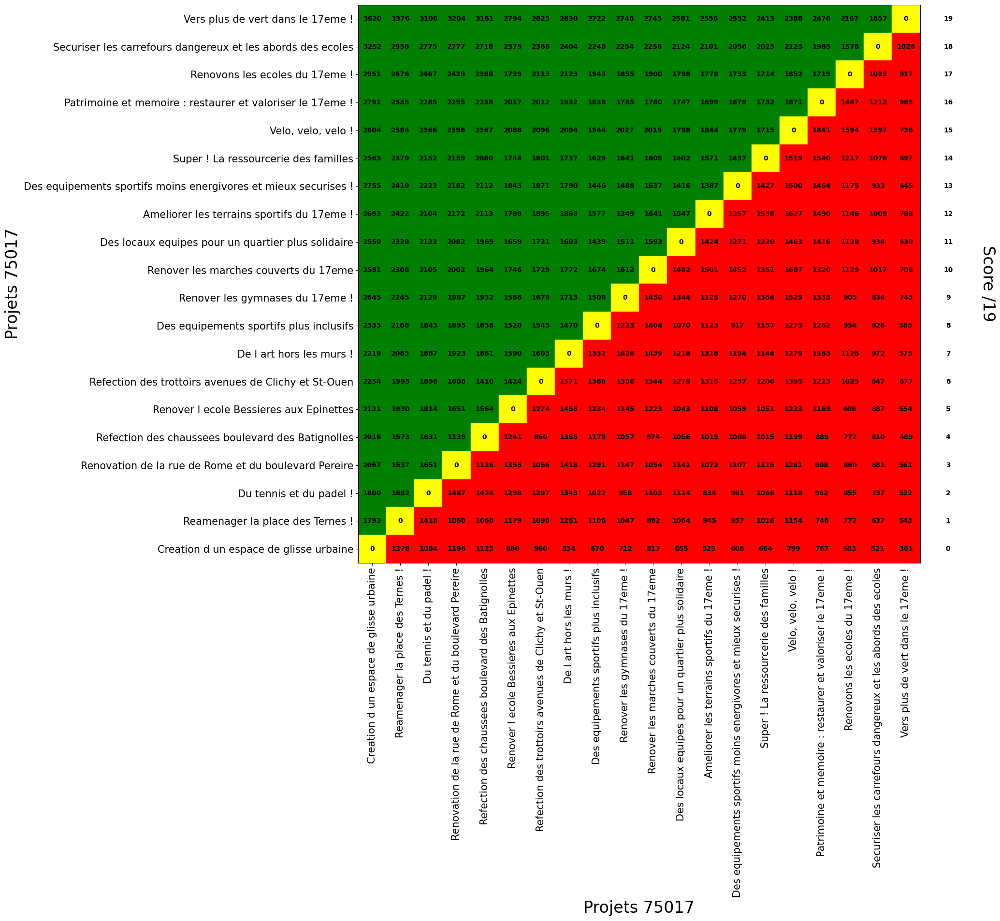

Le gagnant de Condorcet est le projet :  0    Vers plus de vert dans le 17eme !
Name: 9, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75018
                                                    Rang  Rang de Condorcet
Vegetaliser l arrondissement et amenager les pa...     1                  1
Vegetaliser et ameliorer les lieux publics dans...     2                  2
Lutter contre les inegalites d acces                   3                  3
Favoriser le lien social et les pratiques artis...     4                  4
Securiser et amenager pour favoriser les mobili...     5                  5
Doter les ecoles du 18e de davantage d outils n...     6                  7
Kits pedagogiques pour parler aux enfants des p...     7                  6
Restaurer le patrimoine cultuel                        8                  8
Creer une ecole des metiers du velo du Grand Paris     9                  9
Mettre en valeur l histoire du quartier La Chap...    10                 11


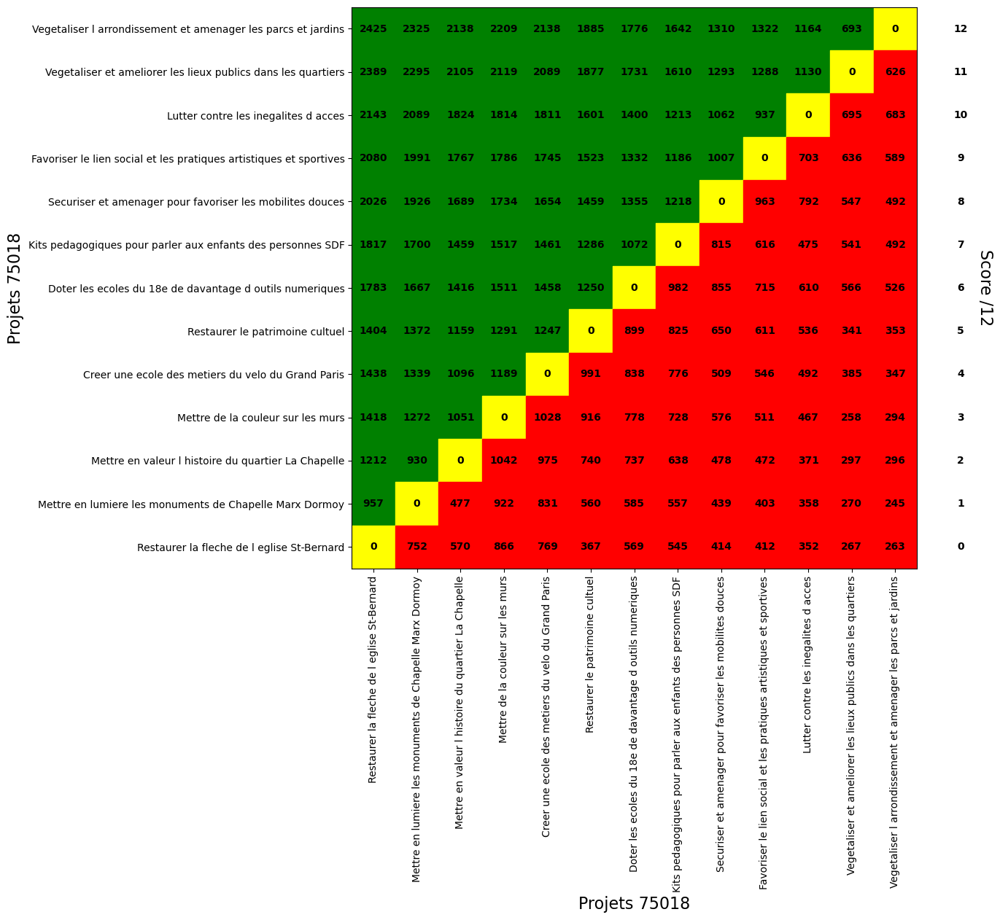

Le gagnant de Condorcet est le projet :  0    Vegetaliser l arrondissement et amenager les p...
Name: 4, dtype: object
On cherche le gagant de Condorcet ou de Lull pour le : 75019
                                                    Rang  Rang de Condorcet
Modernisons nos equipements pour faire du sport...     1                  2
Destination 2024 : le 19e a l heure du sport           2                  5
Soutenons le dynamisme associatif et solidaire ...     3                  1
Rafraichir la ville et promouvoir la biodiversite      4                  2
Marcher et pedaler en toute securite                   5                  5
Faire vivre l inclusion dans le 19e                    6                  8
Embellir et illuminer les rues et jardins de no...     7                 10
Cours vegetalisees, musique et lecture pour mie...     8                  4
Plus belles nos ecoles : de la nature et du cie...     9                  5
Faciliter les deplacements des pietons et des c...    10    

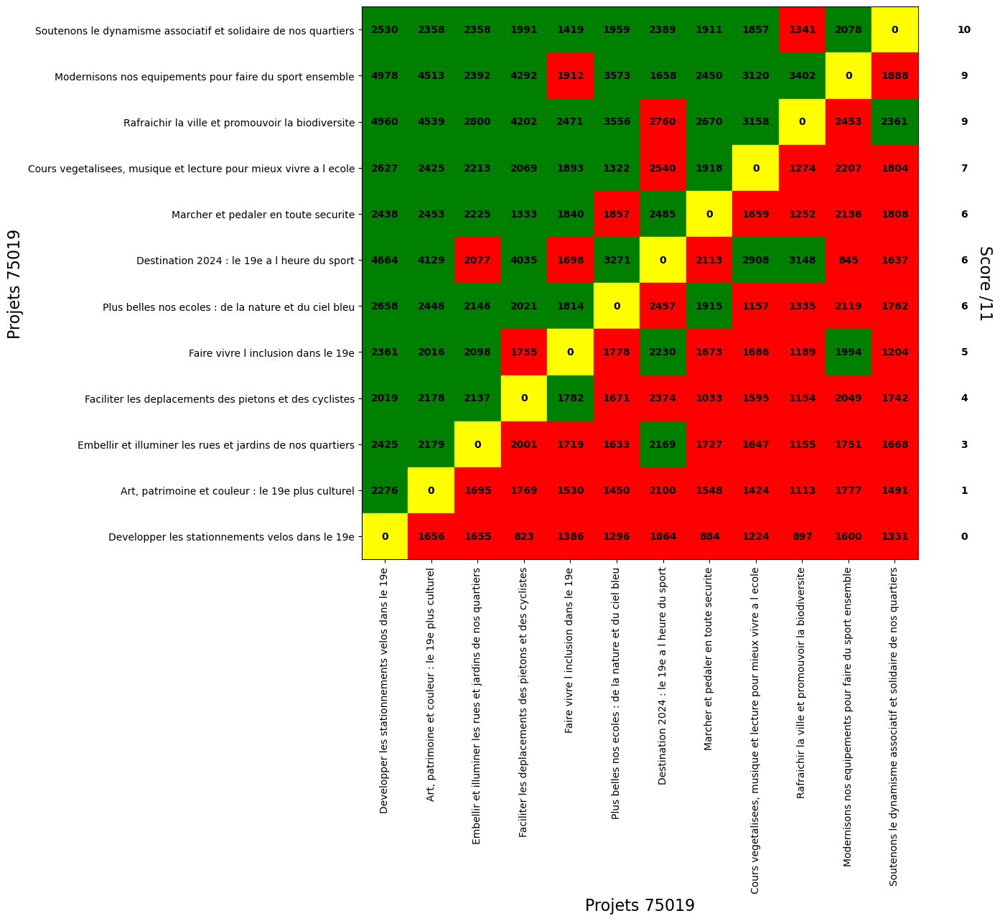

On cherche le gagant de Condorcet ou de Lull pour le : 75020
                                                    Rang  Rang de Condorcet
Amenager des espaces publics verdoyants pour le...     1                  1
Des projets educatifs pour le 20e                      2                  3
Des projets pour la jeunesse du 20e                    3                  2
Amenager et equiper les residences sociales            4                  6
Embellir nos parcs et jardins                          5                  4
Equiper les associations d alimentation durable        6                  5
Poursuivre la restauration de La Fleche d Or : ...     7                  9
Securiser la voirie et apaiser la circulation          8                  7
Embellir le 20e avec des fresques et de la vege...     9                  8
Renovations energetiques pour les ecoles de la ...    10                 10
Restaurer la Maison de l Air pour les habitante...    11                 11


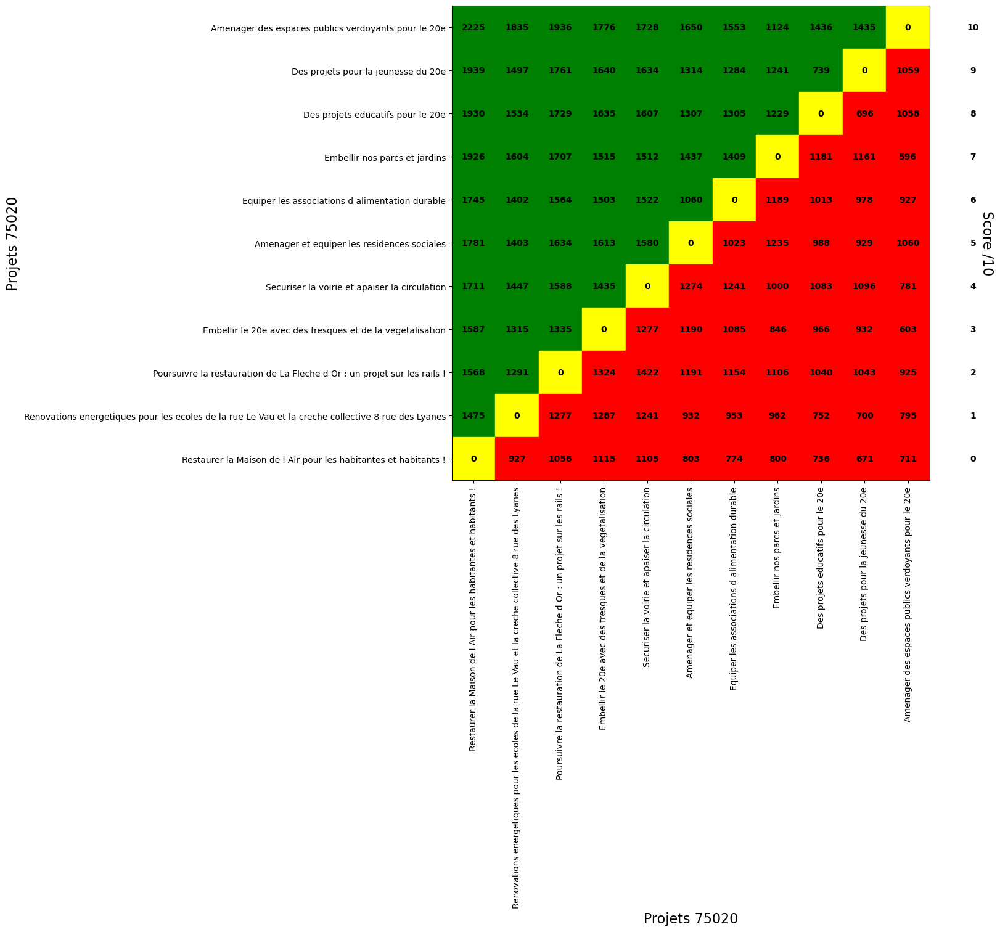

Le gagnant de Condorcet est le projet :  0    Amenager des espaces publics verdoyants pour l...
Name: 4, dtype: object
Temps d'exécution : 0:49:49


In [14]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod_A_strictly_more_than_B(current_df,projets)

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices +/- ; Confrontations Indirectes ; Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs1 = {}
dico1 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod4(current_df,projets)
    dico_rangs1[arrondissement] = resultats[6]
    dico1[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices +/- ; Confrontations Indirectes ; Papier

#### Tout papier

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs2 = {}
dico2 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod4(current_df,projets)
    dico_rangs2[arrondissement] = resultats[6]
    dico2[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement A

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs18 = {}
dico18 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'A']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod4(current_df,projets)
    dico_rangs18[arrondissement] = resultats[6]
    dico18[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement B

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs19 = {}
dico19 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'B']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod4(current_df,projets)
    dico_rangs19[arrondissement] = resultats[6]
    dico19[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices de Condorcet avec le +/- ; Confrontations Directes

In [ ]:
# Fonction finale pour obtenir la matrice des préférences en confrontations directes

def CondorcetMethod5(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] < arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                        elif arr.iloc[User, colonne_i] > arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                        else:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 0.5
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 0.5
              
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2
    
    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref0 = pd.DataFrame(miroir_pref)
    df_condorcet_pref = df_condorcet_pref0.copy()
    # On affiche sur le triangle supérieur le nombre de préférences en plus ou en moins que celles affichées sur le triangle inférieur
    for i in range(Taille):
        for j in range(Taille-1 - i):
            df_condorcet_pref.iloc[i, j] = df_condorcet_pref0.iloc[i, j] - df_condorcet_pref0.iloc[Taille-1-j, Taille-1-i]
            df_condorcet_pref.iloc[i, j] = f"{df_condorcet_pref.iloc[i, j]:+}"
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_condorcet)):
        text = ax.text(len(df_condorcet.columns)-(1 if arrondissement != '75005' else 1.6), i+0.5,df_condorcet.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if df_condorcet.iloc[i, j] == 0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

### Matrices +/- ; Confrontations Directes ; Papier + Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs3 = {}
dico3 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod5(current_df,projets)
    dico_rangs3[arrondissement] = resultats[6]
    dico3[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices +/- ; Confrontations Directes ; Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs4 = {}
dico4 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod5(current_df,projets)
    dico_rangs4[arrondissement] = resultats[6]
    dico4[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices +/- ; Confrontations Directes ; Papier

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs5 = {}
dico5 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod5(current_df,projets)
    dico_rangs5[arrondissement] = resultats[6]
    dico5[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices de Condorcet traditionnelles ; Confrontations Indirectes

In [ ]:
# Fonction finale pour obtenir la matrice des préférences avec les confrontations indirectes (votes uniques 1 ou 4)

def CondorcetMethod6(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] < arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                        elif arr.iloc[User, colonne_i] > arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                        else:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 0.5
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 0.5
                            
        # On ajoute les confrontations indirectes :
            # -> un vote pour le projet i contre tous les autres ou un vote unique pour tous les autres que le projet i
        if arr.iloc[User, 4:-6].eq('novote').sum() == (Taille-1):
            for index_i in range(Taille):
                if arr.iloc[User, index_i] == 1:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_j, index_i] += 1
                elif arr.iloc[User, index_i] == 4:
                    for index_j in range(Taille):
                        if index_i != index_j:
                            Preferences[index_i, index_j] += 1
                        
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2

    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref = pd.DataFrame(miroir_pref)
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_condorcet)):
        text = ax.text(len(df_condorcet.columns)-(1 if arrondissement != '75005' else 1.6), i+0.5,df_condorcet.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if df_condorcet.iloc[i, j] == 0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

### Matrices traditionnelles ; Confrontations Indirectes ; Papier + Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod6
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs6 = {}
dico6 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod6(current_df,projets)
    dico_rangs6[arrondissement] = resultats[6]
    dico6[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices traditionnelles ; Confrontations Indirectes ; Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod6
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs7 = {}
dico7 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod6(current_df,projets)
    dico_rangs7[arrondissement] = resultats[6]
    dico7[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices traditionnelles ; Confrontations Indirectes ; Papier

#### Tout papier

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod6
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs8 = {}
dico8 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod6(current_df,projets)
    dico_rangs8[arrondissement] = resultats[6]
    dico8[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement A

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod6
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs20 = {}
dico20 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'A']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod6(current_df,projets)
    dico_rangs20[arrondissement] = resultats[6]
    dico20[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement B

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod6
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs21 = {}
dico21 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'B']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod6(current_df,projets)
    dico_rangs21[arrondissement] = resultats[6]
    dico21[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices de Condorcet traditionnelles ; Confrontations Directes

In [ ]:
# Fonction finale pour obtenir la matrice des préférences en confrontations directes

def CondorcetMethod7(arr,projets):
    Taille = len(projets)
    Preferences = np.zeros((Taille,Taille))
    Confrontations = np.eye(Taille) * 0.5
    
    # Pour chaque User, on complète la matrice des Préférences
    for User in range(len(arr)):
        for i in range(Taille):
            projet_i = projets[0][i]
            colonne_i = arr.columns.get_loc(projet_i)
            if arr.iloc[User, colonne_i] != 'novote':
                for j in range(i+1,Taille):
                    projet_j = projets[0][j]
                    colonne_j = arr.columns.get_loc(projet_j)
                    if arr.iloc[User, colonne_j] != 'novote':
                        if arr.iloc[User, colonne_i] < arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 1
                        elif arr.iloc[User, colonne_i] > arr.iloc[User, colonne_j]:
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 1
                        else:
                            Preferences[np.where(projets[0] == projet_j)[0], np.where(projets[0] == projet_i)[0]] += 0.5
                            Preferences[np.where(projets[0] == projet_i)[0], np.where(projets[0] == projet_j)[0]] += 0.5
    
    # On obtient la matrice des confrontations 
    for i in range(Taille):
        for j in range(i+1, Taille):
            Confrontations[i,j] = (Preferences[i,j]>Preferences[j,i])+(Preferences[i,j]==Preferences[j,i])/2
            Confrontations[j,i] = (Preferences[j,i]>Preferences[i,j])+(Preferences[i,j]==Preferences[j,i])/2
    
    # On retrouve le classement en fonction du score de Lull
    df_score = pd.DataFrame(np.sum(Confrontations, axis=0) - 0.5, columns=["Score de Lull"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)

    # Nouvelles matrices des Confrontations et des Préférences triées selon le score :
    New_Confrontations = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Confrontations[i,j] = Confrontations[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                     projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Condorcet :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Lull", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Confrontations),axis=1)
    miroir_pref = np.flip(np.transpose(New_Preferences),axis=1)
    df_condorcet = pd.DataFrame(miroir)
    df_condorcet_pref = pd.DataFrame(miroir_pref)
    
    # Classement MJ + Condorcet
    rangs_condorcet = df_classement['Score de Lull'].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Condorcet':rangs_condorcet},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Lull"] = df_classement["Score de Lull"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_condorcet = pd.concat([df_classement, df_condorcet], axis=1)
    df_condorcet_pref = pd.concat([df_classement, df_condorcet_pref], axis=1)

    if (arrondissement != 'Tout Paris') & (arrondissement != 'Paris Centre') & (arrondissement != '75017'):
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(10, 10))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=10)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')
    else :
        # Création de la heatmap
        fig, ax = plt.subplots(figsize=(15, 15))
        heatmap = ax.pcolor(df_condorcet.iloc[:, 2:])
        ax.invert_yaxis()

        # Mise en forme des axes
        ax.set_xticks(np.arange(0.5, len(df_condorcet.columns[2:])+0.5, 1))
        ax.set_yticks(np.arange(0.5, len(df_condorcet)+0.5, 1))
        ax.set_xticklabels(df_condorcet.iloc[:,0][::-1], fontsize=15, rotation=90, ha='center')
        ax.set_yticklabels(df_condorcet.iloc[:,0], fontsize=15)

        # Ajout des titres
        ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=24)
        ax.text(1.12, 0.5, 'Score /{}'.format(Taille -1), fontsize=24, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Ajout des valeurs de la matrice
    for i in range(len(df_condorcet_pref)):
        for j in range(2, len(df_condorcet_pref.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_condorcet_pref.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_condorcet)):
        text = ax.text(len(df_condorcet.columns)-(1 if arrondissement != '75005' else 1.6), i+0.5,df_condorcet.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Création des carrés de couleur
    for i in range(len(df_condorcet)):
        for j in range(2, len(df_condorcet.columns)):
            if df_condorcet.iloc[i, j] == 0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_condorcet.iloc[i, j] == 0.5:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    Condorcet = projets.iloc[Confrontations.sum(axis=0).argmax()]
    if Confrontations.sum(axis=0).max() == (Taille-0.5): print('Le gagnant de Condorcet est le projet : ',Condorcet)
    
    return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0

### Matrices traditionnelles ; Confrontations Directes ; Papier + Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod7
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs9 = {}
dico9 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod7(current_df,projets)
    dico_rangs9[arrondissement] = resultats[6]
    dico9[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices traditionnelles ; Confrontations Directes ; Numérique

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod7
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs10 = {}
dico10 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod7(current_df,projets)
    dico_rangs10[arrondissement] = resultats[6]
    dico10[arrondissement] = resultats
    
end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices traditionnelles ; Confrontations Directes ; Papier

In [ ]:
# Initialiser les données pour créer la matrice des préférences pour chaque arrondissement avec la fonction CondorcetMethod7
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs11 = {}
dico11 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Condorcet ou de Lull pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Condorcet pour l'arrondissement concerné
    resultats = CondorcetMethod7(current_df,projets)
    dico_rangs11[arrondissement] = resultats[6]
    dico11[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

# Borda

## Matrices des pourcentages avec confrontations indirectes

### Matrices des pourcentages ; Confrontations indirectes ; Papier + Numérique

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico0 (confrontations indirectes)

def BordaMethod_4_0(arr,projets):
    Taille = len(projets)
    Preferences = dico0[arrondissement][0]
    Confrontations = dico0[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_0
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs12 = {}
dico_double_rangs0 = {}
dico12 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_4_0(current_df,projets)
    dico_rangs12[arrondissement] = resultats[3]
    dico_double_rangs0[arrondissement] = pd.concat([dico_rangs0[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico12[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des pourcentages ; Confrontations indirectes ; Numérique

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico1 (confrontations indirectes)

def BordaMethod_4_1(arr,projets):
    Taille = len(projets)
    Preferences = dico1[arrondissement][0]
    Confrontations = dico1[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_1
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs13 = {}
dico_double_rangs1 = {}
dico13 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_4_1(current_df,projets)
    dico_rangs13[arrondissement] = resultats[3]
    dico_double_rangs1[arrondissement] = pd.concat([dico_rangs1[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico13[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des pourcentages ; Confrontations indirectes ; Papier

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico2 (confrontations indirectes)

def BordaMethod_4_2(arr,projets):
    Taille = len(projets)
    Preferences = dico2[arrondissement][0]
    Confrontations = dico2[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

#### Tout Papiers

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_2
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs14 = {}
dico_double_rangs2 = {}
dico14 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_4_2(current_df,projets)
    dico_rangs14[arrondissement] = resultats[3]
    dico_double_rangs2[arrondissement] = pd.concat([dico_rangs2[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico14[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement A

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_2
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs22 = {}
dico_double_rangsA = {}
dico22 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'A']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_4_2(current_df,projets)
    dico_rangs22[arrondissement] = resultats[3]
    dico_double_rangsA[arrondissement] = pd.concat([dico_rangs2[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico22[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement B

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_2
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs23 = {}
dico_double_rangsB = {}
dico23 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'B']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_4_2(current_df,projets)
    dico_rangs23[arrondissement] = resultats[3]
    dico_double_rangsB[arrondissement] = pd.concat([dico_rangs2[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico23[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices des pourcentages en confrontations directes

### Matrices des pourcentages ; Confrontations directes ; Papier + Numérique

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico3 (confrontations directes)

def BordaMethod_5_3(arr,projets):
    Taille = len(projets)
    Preferences = dico3[arrondissement][0]
    Confrontations = dico3[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_3
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs15 = {}
dico_double_rangs3 = {}
dico15 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_5_3(current_df,projets)
    dico_rangs15[arrondissement] = resultats[3]
    dico_double_rangs3[arrondissement] = pd.concat([dico_rangs3[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico15[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des pourcentages ; Confrontations directes ; Numérique

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico4 (confrontations directes)

def BordaMethod_5_4(arr,projets):
    Taille = len(projets)
    Preferences = dico4[arrondissement][0]
    Confrontations = dico4[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_4
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs16 = {}
dico_double_rangs4 = {}
dico16 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_5_4(current_df,projets)
    dico_rangs16[arrondissement] = resultats[3]
    dico_double_rangs4[arrondissement] = pd.concat([dico_rangs4[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico16[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des pourcentages ; Confrontations directes ; Papier

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico5 (confrontations directes)

def BordaMethod_5_5(arr,projets):
    Taille = len(projets)
    Preferences = dico5[arrondissement][0]
    Confrontations = dico5[arrondissement][1]
    
    # On crée la matrice des pourcentages
    Pourcentages = np.eye(Taille) * 50
    for i in range(Taille):
        for j in range(i+1, Taille):
            Pourcentages[i,j] = 100 * Preferences[i,j]/(Preferences[i,j] + Preferences[j,i])
            Pourcentages[j,i] = 100 * Preferences[j,i]/(Preferences[i,j] + Preferences[j,i])
    
    # On retrouve le classement en fonction du score de Borda
    df_score = pd.DataFrame((np.sum(Pourcentages, axis=0) - 50)/(Taille-1), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Pourcentages triée selon le score :
    # (On calcule également une nouvelle matrice des Préférences selon le score de Borda qui servira dans la partie manipulabilité)
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Pourcentages[i,j] = Pourcentages[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                                 projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des confrontations et des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Pourcentages),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    print(df_classement0)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(round(x,1)).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(round(df_borda.iloc[i, j],1)).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1.5, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.12, 0.5, 'Scores en %', fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            if df_borda.iloc[i, j] < 50:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='red')
            elif df_borda.iloc[i, j] == 50.0:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j-2, j-1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs17 = {}
dico_double_rangs5 = {}
dico17 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_5_5(current_df,projets)
    dico_rangs17[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangs5[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico17[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

# Borda non normalisé

## Matrices des préférences Papier + Numérique

### Matrices des préférences Papier + Numérique ; Confrontations indirectes

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico0 (confrontations indirectes)

def BordaMethod_NN_0(arr,projets):
    Taille = len(projets)
    Preferences = dico0[arrondissement][0]
    
    # On retrouve le classement en fonction du score de Borda non normalisé
    df_score = pd.DataFrame(np.sum(Preferences, axis=0), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Préférences triée selon le score :
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Preferences),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(13, 13))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_borda.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.15 if (arrondissement != '75005') & (arrondissement != '75009') else 1.3, 0.5, 'Scores en nombre de votes révélant une préférence',\
            fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(len(df_borda)):
            if miroir[i, j] < miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='red')
            elif miroir[i, j] == miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Taille, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_0
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs24 = {}
dico_double_rangsNN0 = {}
dico24 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_0(current_df,projets)
    dico_rangs24[arrondissement] = resultats[3]
    dico_double_rangsNN0[arrondissement] = pd.concat([dico_rangs0[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico24[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des préférences Papier + Numérique ; Confrontations directes

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico3 (confrontations directes)

def BordaMethod_NN_1(arr,projets):
    Taille = len(projets)
    Preferences = dico3[arrondissement][0]
    
    # On retrouve le classement en fonction du score de Borda non normalisé
    df_score = pd.DataFrame(np.sum(Preferences, axis=0), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Préférences triée selon le score :
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Preferences),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(13, 13))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_borda.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.15 if (arrondissement != '75005') & (arrondissement != '75009') else 1.3, 0.5, 'Scores en nombre de votes révélant une préférence',\
            fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(len(df_borda)):
            if miroir[i, j] < miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='red')
            elif miroir[i, j] == miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Taille, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_4_0
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs25 = {}
dico_double_rangsNN1 = {}
dico25 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    
    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_1(current_df,projets)
    dico_rangs25[arrondissement] = resultats[3]
    dico_double_rangsNN1[arrondissement] = pd.concat([dico_rangs0[arrondissement], resultats[3].drop('Rang', axis=1)], axis=1)
    dico25[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices des préférences Numérique

### Matrices des préférences Numérique ; Confrontations indirectes

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico1 (confrontations indirectes)

def BordaMethod_NN_2(arr,projets):
    Taille = len(projets)
    Preferences = dico1[arrondissement][0]
    
    # On retrouve le classement en fonction du score de Borda non normalisé
    df_score = pd.DataFrame(np.sum(Preferences, axis=0), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Préférences triée selon le score :
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Preferences),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(13, 13))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_borda.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.15 if (arrondissement != '75005') & (arrondissement != '75009') else 1.3, 0.5, 'Scores en nombre de votes révélant une préférence',\
            fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(len(df_borda)):
            if miroir[i, j] < miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='red')
            elif miroir[i, j] == miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Taille, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs26 = {}
dico_double_rangsNN2 = {}
dico26 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_2(current_df,projets)
    dico_rangs26[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangsNN2[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico26[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

### Matrices des préférences Numérique ; Confrontations directes

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico4 (confrontations directes)

def BordaMethod_NN_3(arr,projets):
    Taille = len(projets)
    Preferences = dico4[arrondissement][0]
    
    # On retrouve le classement en fonction du score de Borda non normalisé
    df_score = pd.DataFrame(np.sum(Preferences, axis=0), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Préférences triée selon le score :
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Preferences),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(13, 13))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_borda.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.15 if (arrondissement != '75005') & (arrondissement != '75009') else 1.3, 0.5, 'Scores en nombre de votes révélant une préférence',\
            fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(len(df_borda)):
            if miroir[i, j] < miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='red')
            elif miroir[i, j] == miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Taille, New_Pourcentages, df_borda, df_classement0, New_Preferences

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs27 = {}
dico_double_rangsNN3 = {}
dico27 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] == 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_3(current_df,projets)
    dico_rangs27[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangsNN3[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico27[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

## Matrices des préférences Papier

In [ ]:
# Fonction pour obtenir les matrices de Borda à partir des résultats de Condorcet qu'on retrouve dans dico2 (confrontations indirectes)

def BordaMethod_NN_4(arr,projets):
    Taille = len(projets)
    Preferences = dico2[arrondissement][0]
    
    # On retrouve le classement en fonction du score de Borda non normalisé
    df_score = pd.DataFrame(np.sum(Preferences, axis=0), columns=["Score de Borda"])
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)

    # Nouvelle matrice des Préférences triée selon le score :
    New_Pourcentages = np.eye(Taille)
    New_Preferences = np.eye(Taille)
    for i in range(Taille):
        for j in range(Taille):
            New_Preferences[i,j] = Preferences[projets.loc[projets[0] == df_classement.iloc[i,0]].index[0],\
                                               projets.loc[projets[0] == df_classement.iloc[j,0]].index[0]]
    
    # Classement selon la méthode de Borda :
    # Création d'une nouvelle liste de noms de projet modifiés
    new_projets = []
    for i, projet in enumerate(projets[0]):
        if i < 9:
            new_projets.append(projet[4:])
        else:
            new_projets.append(projet[5:])
    # Création d'un nouveau dataframe avec les noms de projet modifiés
    projets = pd.DataFrame(new_projets)
    df_classement = pd.concat([projets,df_score], axis=1)
    df_classement = df_classement.sort_values("Score de Borda", ascending=False)
    
    # Transposition et symétrique de la matrice des préférences pour un affichage en ligne plus lisible
    miroir = np.flip(np.transpose(New_Preferences),axis=1)
    df_borda = pd.DataFrame(miroir)
    
    # Classement MJ + Borda
    rangs_borda = df_classement["Score de Borda"].rank(method='min', ascending=False).astype(int).to_list()
    df_rang = pd.DataFrame({'Rang de Borda':rangs_borda},index = df_classement.iloc[:, 0].values.tolist())    
    df_classementMJ = ClassementMJ(arr)
    new_index_labels = []
    for index in df_classementMJ.index:
        if index[1] == ' ':
            new_index_labels.append(index[4:])
        else:
            new_index_labels.append(index[5:])
    df_classementMJ = df_classementMJ.rename(index=dict(zip(df_classementMJ.index, new_index_labels)))
    df_classement0 = pd.concat([df_classementMJ, df_rang], axis=1)
    
    df_classement["Score de Borda"] = df_classement["Score de Borda"].map(lambda x: str(x).replace(".0",""))
    df_classement = df_classement.reset_index(drop=True)
    df_borda = pd.concat([df_classement, df_borda], axis=1)

    # Création de la heatmap
    fig, ax = plt.subplots(figsize=(13, 13))
    heatmap = ax.pcolor(df_borda.iloc[:, 2:])
    ax.invert_yaxis()

    # Mise en forme des axes
    ax.set_xticks(np.arange(0.5, len(df_borda.columns[2:])+0.5, 1))
    ax.set_yticks(np.arange(0.5, len(df_borda)+0.5, 1))
    ax.set_xticklabels(df_borda.iloc[:,0][::-1], fontsize=10, rotation=90, ha='center')
    ax.set_yticklabels(df_borda.iloc[:,0], fontsize=10)

    # Ajout des valeurs de la matrice
    for i in range(len(df_borda)):
        for j in range(2, len(df_borda.columns)):
            text = ax.text(j-1.5, i+0.5, str(df_borda.iloc[i, j]).replace(".0",""),\
                           ha='center',va='center',color='black',fontweight='bold')

    # Ajout des scores
    for i in range(len(df_borda)):
        text = ax.text(len(df_borda.columns)-1, i+0.5,df_borda.iloc[i, 1],\
                       ha='center', va='center', color='black', fontweight='bold')

    # Ajout des titres
    ax.set_xlabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.set_ylabel('Projets {0}'.format(arrondissement), fontsize=16)
    ax.text(1.15 if (arrondissement != '75005') & (arrondissement != '75009') else 1.3, 0.5, 'Scores en nombre de votes révélant une préférence',\
            fontsize=16, transform=ax.transAxes, rotation=-90, ha='center', va='center')

    # Création des carrés de couleur
    for i in range(len(df_borda)):
        for j in range(len(df_borda)):
            if miroir[i, j] < miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='red')
            elif miroir[i, j] == miroir[Taille-1-j, Taille-1-i]:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='yellow')
            else:
                plt.fill_between([j, j+1], [i, i], [i+1, i+1], color='green')
    plt.show()
    fig.savefig("{}.png".format(arrondissement))
    
    return Taille, New_Pourcentages, df_borda, df_classement0, New_Preferences

#### Tout Papier

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs28 = {}
dico_double_rangsNN4 = {}
dico28 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df.loc[current_df['Urne'] != 'numerique']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_4(current_df,projets)
    dico_rangs28[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangsNN4[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico28[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement A

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs29 = {}
dico_double_rangsNNA = {}
dico29 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'A']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_4(current_df,projets)
    dico_rangs29[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangsNNA[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico29[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

#### Papier uniquement B

In [ ]:
# Initialiser les données pour créer la matrice des pourcentages pour chaque arrondissement avec la fonction BordaMethod_5_5
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
dico_rangs30 = {}
dico_double_rangsNNB = {}
dico30 = {}

for arrondissement in liste_arr:
    print('On cherche le gagant de Borda pour le :', arrondissement)
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    current_df = current_df[current_df['QR-Code'].str[-1] == 'B']

    # Récupérer la liste de tous les projets dans la base de données
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    # On cherche le gagnant de Borda pour l'arrondissement concerné
    resultats = BordaMethod_NN_4(current_df,projets)
    dico_rangs30[arrondissement] = resultats[3]
    test = resultats[3].drop('Rang', axis=1)
    dico_double_rangsNNB[arrondissement] = pd.concat([dico_rangs5[arrondissement], test], axis=1)
    dico30[arrondissement] = resultats

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

# Distance au classement du MJ + Manipulabilité des données

In [ ]:
pd.set_option('display.max_colwidth', 100000)
df = pd.DataFrame.from_dict(dico_rangs24, orient='index')
display(df)

In [ ]:
import pprint
pprint.pprint(dico_rangs24, width=999999999999) # va jusqu'à 17, classement MJ+condorcet jusqu'à 11 puis MJ+Borda, n'importe quel arrondissement

In [ ]:
pd.set_option('display.max_colwidth', 5)
dico_rangs24

In [ ]:
dico_double_rangs0['75019'] # va jusqu'à 5, classement MJ+Condorcet+Borda, n'importe quel arrondissement

In [ ]:
"""
dico0 à 17, [pour chaque arrondissement]:résultats
0 à 11 : résultats Condorcet : les 0 à 5 sont égaux aux 6 à 11, confrontations indirectes P+N, N, P puis indirectes P+N, N, P
dicoX[arr.] return Preferences, Confrontations, New_Confrontations, New_Preferences, df_condorcet, df_condorcet_pref, df_classement0
12 à 17 : résultats Borda :
dicoX[arr.] return Pourcentages, New_Pourcentages, df_borda, df_classement0, New_Preferences [qui n'est pas la même que Condorcet]
"""
dico0['75005'][5]

In [ ]:
def ManipulabiliteCondorcet0(arrondissement, rang_dernier_gagnant):
    rang_dernier_gagnant -= 1 # On raisonne en indices
    # Dataframe colonne projets, score de Lull puis matrice(i,j) = Nombre de préférences de plus qu'i a à j
    condorcet = pd.concat([dico0[arrondissement][5].iloc[:,0:1],\
                           pd.DataFrame(np.transpose(dico0[arrondissement][3])-dico0[arrondissement][3])], axis = 1)
    votes_manipulabilite = []
    for rang_projet in range(rang_dernier_gagnant+1, len(condorcet)):
        objectif_score = float(condorcet.iloc[rang_dernier_gagnant,1]) - float(condorcet.iloc[rang_projet,1])
        votes_strategiques = 0
        liste_prefs = list(condorcet.iloc[rang_projet,1::])
        # On traite les cas d'égalité où il suffit d'un vote pour gagner 0.5 de score
        compte_egalite = 0
        for diff_pref in liste_prefs:
            if diff_pref == 0 & liste_prefs.index(diff_pref) != rang_projet:
                objectif_score -= 0.5
                compte_egalite += 1
        votes_strategiques += 1 if compte_egalite > 0 else 0
        # Si ce n'est pas suffisant pour avoir le score requis, on traite les cas où le projet a moins de préférences que les autres
        while objectif_score > 0: # On ne traite pas les cas d'égalité sur la place du dernier projet gagnant
            maximum_negatif = max([nombre for nombre in liste_prefs if nombre < 0])
            index_maximum_negatif = liste_prefs.index(maximum_negatif)
            liste_prefs[index_maximum_negatif] = 0
            objectif_score -= 1 if index_maximum_negatif != rang_dernier_gagnant else 2
            votes_strategiques = 1 -int(maximum_negatif) # On a pris un vote de plus que l'égalité,
    # en risquant qu'un vote de moins suffise dans le cas improbable où il y aurait une double égalité de projets pile à ce nombre de votes
        votes_manipulabilite.append(votes_strategiques)
    return votes_manipulabilite

In [ ]:
# On utilise la fonction ManipulabiliteCondorcet(arrondissement, rang_dernier_gagnant) pour avoir la liste des votes nécessaires

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
liste_derniers_gagnants = [3,2,2,2,2,2,2,4,3,3,4,4,4,3,3,5,5,4]
numero = 0
manipulabilite_condorcet = {}

for arr in liste_arr:
    manipulabilite_condorcet[arr] = ManipulabiliteCondorcet0(arr, liste_derniers_gagnants[numero])
    numero+=1

manipulabilite_condorcet['Tout Paris']

In [26]:
liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
liste_derniers_gagnants = [3,2,2,2,2,2,2,4,3,3,4,4,4,3,3,5,5,4]
numero = 0
for arrondissement in liste_arr:
    current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')
    current_df = current_df.loc[current_df['Categorie'] == 'Valide']
    projets = current_df.iloc[:, 4:-6].columns.tolist()
    projets = pd.DataFrame([projets]).T
    print(arrondissement, ' : ', len(projets), liste_derniers_gagnants[numero])
    numero+=1

Paris Centre  :  16 3


/tmp/ipykernel_592/58996703.py:6: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  current_df = pd.read_csv('Votes {} complet.csv'.format(arrondissement), encoding = 'latin1', sep = ',')


Tout Paris  :  13 2
75005  :  6 2
75006  :  10 2
75007  :  10 2
75008  :  11 2
75009  :  7 2
75010  :  12 4
75011  :  10 3
75012  :  12 3
75013  :  10 4
75014  :  10 4
75015  :  11 4
75016  :  10 3
75017  :  20 3
75018  :  13 5
75019  :  12 5
75020  :  11 4


In [ ]:
def ManipulabiliteBorda0(arrondissement, rang_dernier_gagnant):    
    # On reprend la matrice New_préférences transposée où les (i,j) sont les rangs dans Borda (et M(i,j) la préférence de projet i au j°)
    New_Preferences = np.transpose(dico12[arrondissement][4])
    Taille = len(New_Preferences)    
    votes_manipulabilite = []
    s=0
    
    for rang_projet in range(rang_dernier_gagnant, Taille):
        Preferences_strat = New_Preferences.copy()
        Pourcentages = np.eye(Taille)
        votes_strategiques = 0
        test = True
        while test : # Tant qu'on n'a pas au moins la rang_dernier_gagnant° moyenne des pourcentages,
            # On ajoute un votant stratégique :
            for j in range(Taille):
                Preferences_strat[rang_projet,j] += 1 if j != rang_projet else 0
            votes_strategiques += 1
            # On recrée la matrice des pourcentages à laquelle on a ajouté un votant stratégique
            for i in range(Taille):
                for j in range(i+1, Taille):
                    Pourcentages[i,j] = 100 * Preferences_strat[i,j]/(Preferences_strat[i,j] + Preferences_strat[j,i])
                    Pourcentages[j,i] = 100 * Preferences_strat[j,i]/(Preferences_strat[i,j] + Preferences_strat[j,i])
            
            scores = np.sum(Pourcentages, axis=1).tolist()
            scores_tries = sorted(scores, reverse=True)
            # On teste si on a au moins la rang_dernier_gagnant° moyenne des pourcentages
            for rangs_gagnants in range(rang_dernier_gagnant):
                test = test & (scores_tries[rangs_gagnants] != scores[rang_projet])
        votes_manipulabilite.append(votes_strategiques)
    return votes_manipulabilite

In [ ]:
# On utilise la fonction ManipulabiliteBorda0(arrondissement, rang_dernier_gagnant) pour avoir la liste des votes nécessaires
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
liste_derniers_gagnants = [3,2,2,2,2,2,2,4,3,3,4,4,4,3,3,5,5,4]
numero = 0
manipulabilite_borda = {}

for arr in liste_arr:
    manipulabilite_borda[arr] = ManipulabiliteBorda0(arr, liste_derniers_gagnants[numero])
    numero+=1

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

manipulabilite_borda

In [ ]:
def ManipulabiliteBordaNN0(arrondissement, rang_dernier_gagnant):    
    # On reprend les scores de chaque projet
    scores_borda_NN = dico24[arrondissement][2].iloc[:,1]
    projets = dico24[arrondissement][2].iloc[:,0]
    votes_manipulabilite = []
    dico_manipulabilite = {}
    for i in range(rang_dernier_gagnant):
        dico_manipulabilite[projets[i]] = 0
    for rang_projet in range(rang_dernier_gagnant, len(scores_borda_NN)):
        votes_strategiques = int(np.ceil(float(scores_borda_NN[rang_dernier_gagnant-1]) - float(scores_borda_NN[rang_projet])))
        votes_manipulabilite.append(votes_strategiques)
        dico_manipulabilite[projets[rang_projet]] = votes_strategiques
    return votes_manipulabilite, dico_manipulabilite

In [ ]:
# On utilise la fonction ManipulabiliteBordaNN0(arrondissement, rang_dernier_gagnant) pour avoir la liste des votes nécessaires
start_time = datetime.datetime.now()

liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
liste_derniers_gagnants = [3,2,2,2,2,2,2,4,3,3,4,4,4,3,3,5,5,4]
numero = 0
manipulabilite_borda_NN = {}
dico_borda_NN = {}

for arr in liste_arr:
    resultats = ManipulabiliteBordaNN0(arr, liste_derniers_gagnants[numero])
    manipulabilite_borda_NN[arr] = resultats[0]
    dico_borda_NN[arr] = resultats[1]
    numero+=1

end_time = datetime.datetime.now()
execution_time = end_time - start_time
formatted_time = str(execution_time).split(".")[0]
print("Temps d'exécution : {}".format(formatted_time))

manipulabilite_borda_NN

In [ ]:
manipulabilite_borda['Tout Paris']

In [ ]:
manipulabilite_condorcet['Tout Paris']

# Code Sarah pour le classement notation

In [ ]:
def VoteParNotation(df, num_or_paper):
    
    # Pour votes numériques uniquement : num_or_paper = 'numerique'
    if num_or_paper == 'numerique':
        df = df.loc[df['Urne'] == 'numerique']
    
    # Pour votes papiers uniquement : num_or_paper = 'papier'
    elif num_or_paper == 'papier':
        df = df[df['Urne']!='numerique']
        
    # Pour tous les votes : num_or_paper = 'tous'   
    else:
        df = df
    
    # Forcer toutes les entrées à float (NaN pour 'novote')
    df = df.apply(pd.to_numeric, errors='coerce', downcast='float')
    
    # Supprimer colonnes inutiles pour le calcul
    df = df.drop( ['ID','Urne','QR-Code','Categorie','Nombre de mentions','Mention 1','Mention 2','Mention 3','Mention 4','Pas de Mention'], axis=1)
    
    # Supprimer les voteurs n'aant pas voté pour tous les projets
    df=df.dropna()
    
    # Note d'un projet = somme des notes de voteurs du projet
    notes = df.sum(axis=0)
    classement = pd.DataFrame(notes)
    classement = classement.rename(columns = {0:'Note'})
    classement['Rang Moyenne'] = classement['Note'].rank(ascending=True)
    del classement['Note']
    classement = classement.sort_values('Rang Moyenne')
    return classement

In [ ]:
# Liste data files

files = ['Votes Tout Paris complet.csv','Votes Paris Centre complet.csv',
        'Votes 75005 complet.csv', 'Votes 75006 complet.csv', 'Votes 75007 complet.csv', 'Votes 75008 complet.csv',
        'Votes 75009 complet.csv', 'Votes 75010 complet.csv', 'Votes 75011 complet.csv', 'Votes 75012 complet.csv',
        'Votes 75013 complet.csv', 'Votes 75014 complet.csv', 'Votes 75015 complet.csv', 'Votes 75016 complet.csv',
        'Votes 75017 complet.csv', 'Votes 75019 complet.csv', 'Votes 75020 complet.csv',]

In [ ]:
VoteParNotation(pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1'), 'tous')

In [ ]:
# Dictionnaires contenant les classements 

dict_VoteParNotation_num = dict.fromkeys((range(17)))
dict_VoteParNotation_papier = dict.fromkeys((range(17)))
dict_VoteParNotation_tous = dict.fromkeys((range(17)))
i=0 

for arr in files:
    df = pd.read_csv(arr, encoding = 'latin1')
    dict_VoteParNotation_num[i] =  VoteParNotation(df, 'numerique')
    dict_VoteParNotation_papier[i] = VoteParNotation(df, 'papier')
    dict_VoteParNotation_tous[i] = VoteParNotation(df, 'tous')
    i = i+1

In [ ]:
dict_VoteParNotation_tous[0]

# Code Baptiste votes strat nécessaires MJ adapté pour Notation

In [ ]:
d_mention = {'7 - Une ville plus belle et plus propre':'4',
                            '9 - Des ilots de fraicheurs pour faire face aux canicules':'4',
                            '12 - Des lieux anti-gaspi et solidaires en bas de chez soi':'4',
                            '10 - Plus de biodiversite dans la ville':'4',
                            '8 - Des batiments publics plus performants face au changement climatique':'4',
                            '1 - Des pistes cyclables plus colorees et securisees':'4',
                            '2 - Du sport pour tous les gouts dans la ville':'4',
                            '11 - De nouvelles manieres d apprendre pour les enfants et les jeunes':'4',
                            '4 - La solidarite en actions dans la ville':'4',
                            '6 - De nouveaux outils pour mieux mesurer le bruit en ville':'4',
                            '5 - Le numerique pour toutes et tous':'4',
                            '3 - La Pagode du centre sportif Jules Ladoumegue renovee':'4',
                            '13 - De nouveaux espaces pour les chiens dans la ville':'4'}
d_mention

In [ ]:

def mentions(df,projet):
    Result = list(dict_VoteParNotation_tous[0].index)
    Rank = Result.index(projet)
    lower_project = Result[Rank]
    del Result[Rank]
    NewResult = [Result[0]] + [lower_project] + Result[1:len(Result)]
    Check_First = [lower_project] + [Result[0]] + Result[1:len(Result)]

    d_mention = {NewResult[0] : '4', NewResult[1] : '1'}
    for k in range(2,len(NewResult)):
        d_mention[NewResult[k]] = '4'
    return(d_mention,NewResult,Check_First)


def VotersStrat(df,nb_S,d_mention):
    col = list(df.columns)
    list_project = col[4:(len(col)-6)]
    end = col[(len(col)-5):]
    a = pd.DataFrame({'ID': ['VoterStrat' for i in range(nb_S)],
         'Urne': ['Strat' for i in range(nb_S)],
         "QR-Code" : [list(df["QR-Code"])[-1] for i in range(nb_S)],
        'Categorie' : ['Valide' for i in range(nb_S)]},index = [i for i in range(nb_S)])
    
    c = pd.DataFrame()
    for j in range(0,len(list_project)):
        d = pd.DataFrame({list_project[j] : [d_mention[list_project[j]] for i in range(nb_S)]},index = [i for i in range(nb_S)])
        c = pd.concat([c,d], axis = 1)
    a = pd.concat([a,c],axis = 1)
    
    end = pd.DataFrame({'Nombre de mentions':[13 for i in range(nb_S)],
        'Mention 1':[1 for i in range(nb_S)],
        'Mention 2':[0 for i in range(nb_S)],
        'Mention 3':[0 for i in range(nb_S)],
        'Mention 4':[12 for i in range(nb_S)],
        'Pas de Mention':[0 for i in range(nb_S)]},index = [i for i in range(nb_S)])

    a = pd.concat([a,end],axis = 1)
  
    return(a)

def threshold_Strategic(df,nb,pas,projet,V_Strat):
    
    d_mention = mentions(df,projet)
    NewResult = d_mention[1]
    Check_First = d_mention[2]

    VoterStrat =V_Strat.head(pas)

    VoterStratDepart = V_Strat.head(nb)
        
    new_df = df
    new_df = pd.concat([new_df,VoterStratDepart],axis=0,ignore_index=False)
    

    while list(VoteParNotation(new_df,'').index) != Check_First and list(VoteParNotation(new_df,'').index) != NewResult and nb < 50000:
        nb+=pas
        print(nb)
        new_df = pd.concat([new_df,VoterStrat],axis=0,ignore_index=False)

    
    return(nb)


In [ ]:
def threshold(df,projet,B_Strat):
    A = 0
    for g in [10000,1000,100,10,1]:
        A = threshold_Strategic(df,A,g,projet,B_Strat) - g
    return(A)

In [ ]:
Bases_Strat = pd.read_csv('BASESSTRAT.csv', encoding = 'latin1', sep = ',')

In [ ]:
Liste_Projets = list(pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1').columns)[4:(len(list(pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1').columns))-6)]
dict_seuilProjets = {}
Bases_Strat = pd.read_csv('BASESSTRAT.csv', encoding = 'latin1', sep = ',')

for t in range(0,len(Liste_Projets)):
    Bases_Strat = Bases_Strat.replace(np.array([4]),'4')
    Bases_Strat[Liste_Projets[t]] = Bases_Strat[Liste_Projets[t]].replace('4','1')
    dict_seuilProjets[Liste_Projets[t]] = threshold(pd.read_csv('Votes Tout Paris complet.csv', encoding = 'latin1'),Liste_Projets[t],Bases_Strat)
    Bases_Strat = pd.read_csv('BASESSTRAT.csv', encoding = 'latin1', sep = ',')

dict_seuilProjets

In [ ]:
JM = {'7 - Une ville plus belle et plus propre': 49999,
 '9 - Des ilots de fraicheurs pour faire face aux canicules': 49999,
 '12 - Des lieux anti-gaspi et solidaires en bas de chez soi': 2175,
 '10 - Plus de biodiversite dans la ville': 2134,
 '8 - Des batiments publics plus performants face au changement climatique': 2327,
 '1 - Des pistes cyclables plus colorees et securisees': 6604,
 '2 - Du sport pour tous les gouts dans la ville': 8923,
 '11 - De nouvelles manieres d apprendre pour les enfants et les jeunes': 9487,
 '4 - La solidarite en actions dans la ville': 11590,
 '6 - De nouveaux outils pour mieux mesurer le bruit en ville': 14164,
 '5 - Le numerique pour toutes et tous': 18781,
 '3 - La Pagode du centre sportif Jules Ladoumegue renovee': 19937,
 '13 - De nouveaux espaces pour les chiens dans la ville': 49999}

C = {'7 - Une ville plus belle et plus propre': 49999,
 '9 - Des ilots de fraicheurs pour faire face aux canicules': 49999,
     '10 - Plus de biodiversite dans la ville': 1168,
     '8 - Des batiments publics plus performants face au changement climatique': 1521,
 '12 - Des lieux anti-gaspi et solidaires en bas de chez soi': 2981,
 '1 - Des pistes cyclables plus colorees et securisees': 7982,
      '11 - De nouvelles manieres d apprendre pour les enfants et les jeunes': 9361,
 '4 - La solidarite en actions dans la ville': 10124,
 '2 - Du sport pour tous les gouts dans la ville': 11125,
 '6 - De nouveaux outils pour mieux mesurer le bruit en ville': 16349,
 '5 - Le numerique pour toutes et tous': 17844,
 '3 - La Pagode du centre sportif Jules Ladoumegue renovee': 24547,
 '13 - De nouveaux espaces pour les chiens dans la ville': 28539}

#yC = [2981,1168,1521,7982,11125,9361,10124,16349,17844,24547,28539]
yC = list(C.values())[2:12]

In [ ]:
#y = list(dict_seuilProjets_RANG.values())
y=list(JM.values())[2:12]
print(y)
#x = ['12', '10', '8', '1', '2', '11', '4', '6', '5', '3', '13']
x = [n for n in range(3,13)]
plt.plot(x,y,color = "darkblue")
plt.plot(x,yC,color = "red")

# On fait le graph du nombre de votes stratégiques recquis pour faire gagner un projet perdant en fonction du classement de ces projets selon chaque classement

In [ ]:
#liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
#             '75016','75017','75018','75019','75020']
liste_arr = ['Tout Paris']

for arr in liste_arr:
    # Liste des valeurs pour l'axe des abscisses
    x = list(range(1, len(manipulabilite_borda[arr]) + 1))

    # Liste des valeurs pour les courbes
    liste_MJ = [2175, 2134, 2327, 6604, 8923, 9487, 11590, 14164, 18781, 19937,49999] # A changer selon l'arrondissement
    liste_condorcet = manipulabilite_condorcet[arr]
    liste_borda = manipulabilite_borda[arr] 
    liste_notation = [99,215,923,3320,3983,4190,5100,7068,7829,12643,13677] # A changer selon l'arrondissement

    # Création de la figure et du sous-plot
    fig, ax = plt.subplots()

    # Tracé des courbes
    ax.plot(x, liste_MJ, label='Courbe Jugement Majoritaire')
    ax.plot(x, liste_condorcet, label='Courbe Condorcet')
    ax.plot(x, liste_borda, label='Courbe Borda')
    ax.plot(x, liste_notation, label='Courbe par notation')

    # Ajout des titres d'axes
    ax.set_xlabel('Faire gagner le X° projet perdant')
    ax.set_ylabel('Nombre de votants stratégiques nécessaires')

    # Ajout du titre
    ax.set_title('Manipulabilité {}'.format(arr))

    # Ajout de la légende
    ax.legend()

    # Affichage du graphique
    plt.show()

In [ ]:
Votes_MJ = [2175, 2134, 2327, 6604, 8923, 9487, 11590, 14164, 18781, 19937]

In [ ]:
liste_arr = ['Paris Centre','Tout Paris','75005','75006','75007','75008','75009','75010','75011','75012','75013','75014','75015',\
             '75016','75017','75018','75019','75020']
for arr in liste_arr:
    # Liste des valeurs pour l'axe des abscisses
    x = list(range(1, len(manipulabilite_borda[arr]) + 1))

    # Liste des valeurs pour les courbes
    liste_condorcet = manipulabilite_condorcet[arr]
    liste_borda = manipulabilite_borda[arr] 

    # Création de la figure et du sous-plot
    fig, ax = plt.subplots()

    # Tracé des courbes
    #ax.plot(x, liste_MJ, label='Courbe Jugement Majoritaire')
    ax.plot(x, liste_condorcet, label='Courbe Condorcet')
    ax.plot(x, liste_borda, label='Courbe Borda')
    #ax.plot(x, liste_notation, label='Courbe par notation')

    # Ajout des titres d'axes
    ax.set_xlabel('Faire gagner le X° projet perdant')
    ax.set_ylabel('Nombre de votants stratégiques nécessaires')
    
    # Ajout du titre
    ax.set_title('Manipulabilité {}'.format(arr))

    # Ajout de la légende
    ax.legend()

    # Affichage du graphique
    plt.show()

# 